# Stock Price Prediction (Research)

## Imports

In [2]:
import yfinance as yf
import pandas as pd
import datetime
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, LSTM
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split



## Set seed for reproducibility

In [3]:
import numpy as np
import random
import tensorflow as tf


np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)


## Loading in the stock data

In [4]:
# Scrape S&P 500 tickers from Wikipedia
url = 'https://en.wikipedia.org/wiki/List_of_S%26P_500_companies'
data = pd.read_html(url)
sp500_tickers = data[0]['Symbol'].tolist()


In [5]:
# Get the current date
end_date = datetime.datetime.now().strftime("%Y-%m-%d")

# start date
start_date = '2018-01-01'

sp500_data = {}

# Loop through each ticker in the S&P 500 list
for ticker in sp500_tickers:
    # Download historical data for the ticker from Yahoo Finance
    data = yf.download(ticker, start=start_date, end=end_date)
    
    # Store the data in a Pandas DataFrame with the ticker as the column name
    sp500_data[ticker] = pd.DataFrame(data)




[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

In [6]:
# Print the first few rows of each DataFrame
for ticker, data_frame in sp500_data.items():
    print(f"First few rows of {ticker}:")
    print(data_frame.head())


First few rows of MMM:
                  Open        High         Low       Close   Adj Close  \
Date                                                                     
2018-01-02  197.140472  198.219070  194.657196  197.023407  147.142410   
2018-01-03  196.546829  197.098663  195.058533  197.015045  147.136200   
2018-01-04  198.160538  200.200668  197.717392  199.590302  149.059494   
2018-01-05  199.540131  201.421402  198.779266  201.145493  150.220917   
2018-01-08  200.150497  201.454849  199.983276  200.493317  149.733826   

             Volume  
Date                 
2018-01-02  3505476  
2018-01-03  2623665  
2018-01-04  2682748  
2018-01-05  2195736  
2018-01-08  2235324  
First few rows of AOS:
                 Open       High        Low      Close  Adj Close  Volume
Date                                                                     
2018-01-02  61.450001  61.610001  61.040001  61.529999  55.089043  679200
2018-01-03  61.599998  61.990002  61.290001  61.900002  55.

## Checking for missing values

In [7]:
# Loop through each ticker in the S&P 500 list
for ticker in sp500_tickers:
    # Download historical data for the ticker from Yahoo Finance
    data = yf.download(ticker, start=start_date, end=end_date)
    
    # Store the data in a Pandas DataFrame with the ticker as the column name
    sp500_data[ticker] = pd.DataFrame(data)
    
    # Check for missing values
    missing_values = sp500_data[ticker].isnull().sum()
    
    # missing values for each ticker
    print(f"Missing values for {ticker}:")
    print(missing_values)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for MMM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for AOS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for ABT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ABBV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for ACN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ADBE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for AMD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for AES:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for AFL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for A:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for APD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ABNB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for AKAM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ALB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for ARE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ALGN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ALLE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for LNT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ALL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for GOOGL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for GOOG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for MO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for AMZN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AMCR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for AEE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for AAL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AEP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AXP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for AIG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for AMT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for AWK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for AMP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for AME:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for AMGN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for APH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ADI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ANSS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AON:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for APA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for AAPL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for AMAT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for APTV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ACGL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for ADM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ANET:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for AJG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for AIZ:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for T:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for ATO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ADSK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for ADP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for AZO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AVB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for AVY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for AXON:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for BKR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for BALL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for BAC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for BK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for BBWI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for BAX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for BDX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed

1 Failed download:
['BRK.B']: Exception('%ticker%: No timezone found, symbol may be delisted')


Missing values for BRK.B:
Open         0.0
High         0.0
Low          0.0
Close        0.0
Adj Close    0.0
Volume       0.0
dtype: float64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for BBY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for BIO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TECH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for BIIB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for BLK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for BX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for BA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for BKNG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for BWA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for BXP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for BSX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for BMY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AVGO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for BR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for BRO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed

1 Failed download:
['BF.B']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2018-01-01 -> 2024-04-16)')
[*********************100%%**********************]  1 of 1 completed


Missing values for BF.B:
Open         0.0
High         0.0
Low          0.0
Close        0.0
Adj Close    0.0
Volume       0.0
dtype: float64
Missing values for BLDR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for BG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CDNS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for CZR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CPT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CPB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for COF:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for CAH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for KMX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CCL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for CARR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CTLT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CAT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for CBOE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CBRE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for CDW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for COR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CNC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for CNP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CF:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for CHRW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CRL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for SCHW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CHTR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for CVX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CMG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for CB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CHD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CINF:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for CTAS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CSCO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for C:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CFG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CLX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CME:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CMS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for KO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CTSH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CMCSA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CMA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CAG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for COP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ED:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for STZ:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CEG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for COO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CPRT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for GLW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CPAY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CTVA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CSGP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for COST:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CTRA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CCI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CSX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CMI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CVS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DHR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DRI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DVA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DAY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DECK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DAL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DVN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DXCM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for FANG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DLR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DFS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DLTR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for D:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DPZ:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for DOV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for DOW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DHI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DTE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DUK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for EMN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for ETN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for EBAY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ECL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for EIX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for EW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for EA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ELV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for LLY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for EMR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ENPH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for ETR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for EOG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for EPAM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for EQT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for EFX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for EQIX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for EQR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ESS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for EL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ETSY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for EG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for EVRG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ES:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for EXC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for EXPE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for EXPD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for EXR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for XOM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for FFIV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for FDS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for FICO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for FAST:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for FRT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for FDX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for FIS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for FITB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for FSLR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for FE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for FI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for FMC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for F:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for FTNT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for FTV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for FOXA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for FOX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for BEN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for FCX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for GRMN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for IT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for GE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for GEHC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for GEV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for GEN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for GNRC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for GD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for GIS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for GM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for GPC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for GILD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for GPN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for GL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for GS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HAL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HIG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for HAS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for HCA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for DOC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for HSIC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HSY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for HES:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for HPE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for HLT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for HOLX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HON:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HRL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for HST:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for HWM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HPQ:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HUBB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for HUM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for HBAN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HII:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for IBM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for IEX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for IDXX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for ITW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ILMN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for INCY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for IR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PODD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for INTC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ICE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for IFF:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for IP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for IPG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for INTU:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ISRG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for IVZ:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for INVH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for IQV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for IRM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for JBHT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for JBL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for JKHY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for J:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for JNJ:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for JCI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for JPM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for JNPR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for K:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for KVUE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for KDP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for KEY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for KEYS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for KMB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for KIM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for KMI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for KLAC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for KHC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for KR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for LHX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for LH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for LRCX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for LW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for LVS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for LDOS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for LEN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for LIN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for LYV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for LKQ:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for LMT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for L:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for LOW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for LULU:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for LYB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MTB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for MRO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for MPC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for MKTX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for MAR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for MMC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for MLM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for MAS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for MA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MTCH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MKC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MCD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MCK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MDT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for MRK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for META:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for MET:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for MTD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MGM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MCHP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for MU:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for MSFT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for MAA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for MRNA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for MHK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for MOH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for TAP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for MDLZ:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MPWR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MNST:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MCO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MOS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MSI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MSCI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for NDAQ:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for NTAP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for NFLX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for NEM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for NWSA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for NWS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for NEE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for NKE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for NI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for NDSN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for NSC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for NTRS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for NOC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for NCLH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for NRG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for NUE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for NVDA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for NVR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for NXPI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ORLY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for OXY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ODFL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for OMC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ON:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for OKE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ORCL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for OTIS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for PCAR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for PKG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PANW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PARA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PAYX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PAYC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PYPL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PNR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PEP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PFE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PCG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PSX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PNW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PXD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PNC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for POOL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PPG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for PPL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for PFG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for PG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for PGR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for PLD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for PRU:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for PEG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for PTC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PSA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for PHM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for QRVO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PWR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for QCOM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for DGX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for RL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for RJF:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for RTX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for O:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for REG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for REGN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for RF:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for RSG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for RMD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for RVTY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for RHI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ROK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ROL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for ROP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ROST:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for RCL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for SPGI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CRM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for SBAC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for SLB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for STX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for SRE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for NOW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for SHW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for SPG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for SWKS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for SJM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for SNA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for SOLV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for SO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for LUV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for SWK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for SBUX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for STT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for STLD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for STE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for SYK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for SMCI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for SYF:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for SNPS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for SYY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for TMUS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TROW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TTWO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TPR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TRGP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TGT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for TEL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for TDY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TFX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TER:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TSLA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TXN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for TXT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for TMO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TJX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TSCO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for TT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for TDG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for TRV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for TRMB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for TFC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for TYL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TSN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for USB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for UBER:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for UDR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ULTA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for UNP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for UAL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for UPS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for URI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for UNH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for UHS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for VLO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for VTR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for VLTO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for VRSN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for VRSK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for VZ:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for VRTX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for VTRS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for VICI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for V:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for VMC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for WRB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for WAB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for WBA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for WMT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for DIS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for WBD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for WM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for WAT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for WEC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for WFC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for WELL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for WST:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for WDC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for WRK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for WY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for WMB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for WTW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for GWW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for WYNN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for XEL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for XYL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for YUM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ZBRA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Missing values for ZBH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ZTS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


In [ ]:
print(sp500_data['AAPL']['Open'])

There was no timezone found for 'BKR' and 'BR', hency why we are going to remove the tickers

In [ ]:
#['BRK.B']: Exception('%ticker%: No timezone found, symbol may be delisted')
#['BF.B']: Exception('%ticker%: No price data found, symbol may be delisted (1d 1990-01-01 -> 2024-02-11)')

In [ ]:
tickers_to_drop = ['BRK', 'BF'] 

for symbol in tickers_to_drop:
    sp500_data.pop(symbol, None)


In [ ]:
# Print keys before removal
print("Keys before removal:", sp500_data.keys())

# Remove tickers
tickers_to_drop = ['BRK', 'BF','BRK.B','BF.B','IQV']
for symbol in tickers_to_drop:
    sp500_data.pop(symbol, None)

# Print keys after removal
print("Keys after removal:", sp500_data.keys())


In [ ]:
ticker_to_check = 'BRK.B' and 'BF.B' and 'IQV'
print(ticker_to_check in sp500_data.keys()) 

In [ ]:
tickers_to_remove = ['BRK.B', 'BF.B', 'IQV']  

sp500_tickers = [ticker for ticker in sp500_tickers if ticker not in tickers_to_remove]


There are no missing values for any of the stock tickers. We can proceed.

## Visualization of Stock Prices

Before we apply the engineering on the features and apply the machine learning models, we are going to plot the stock tickers to see the general movement of the stocks.

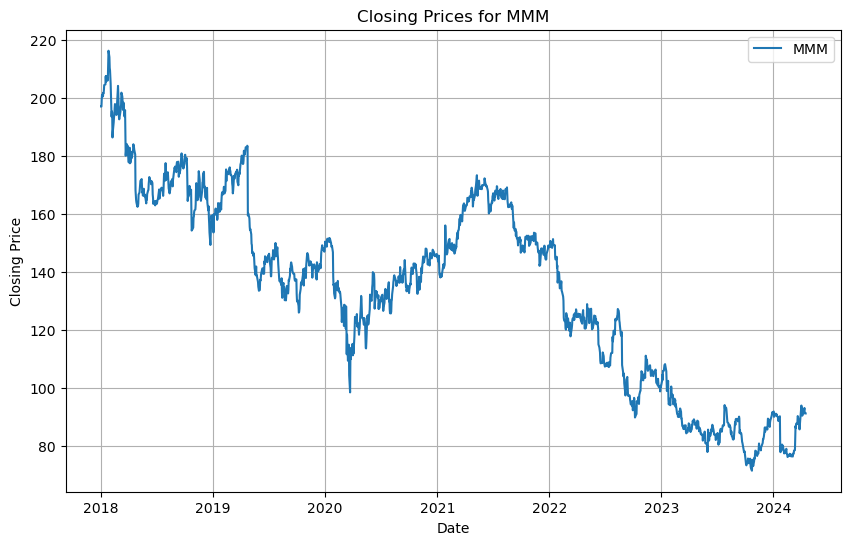

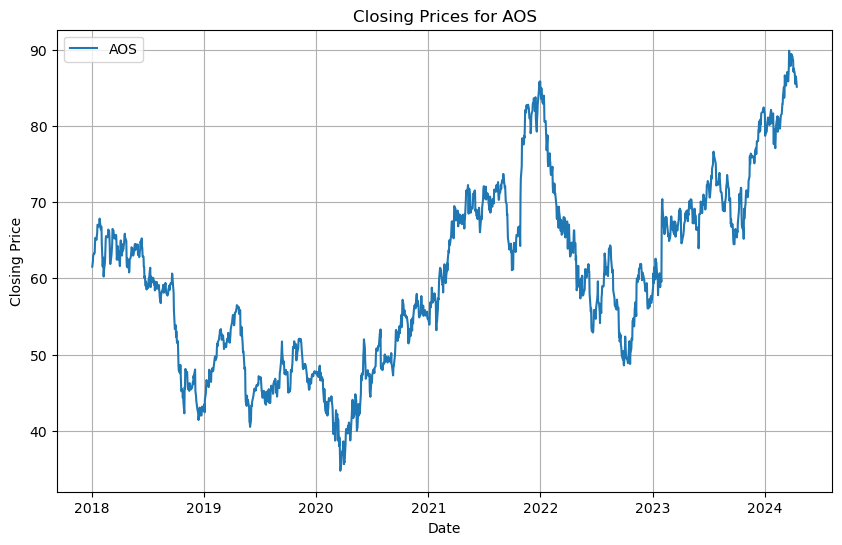

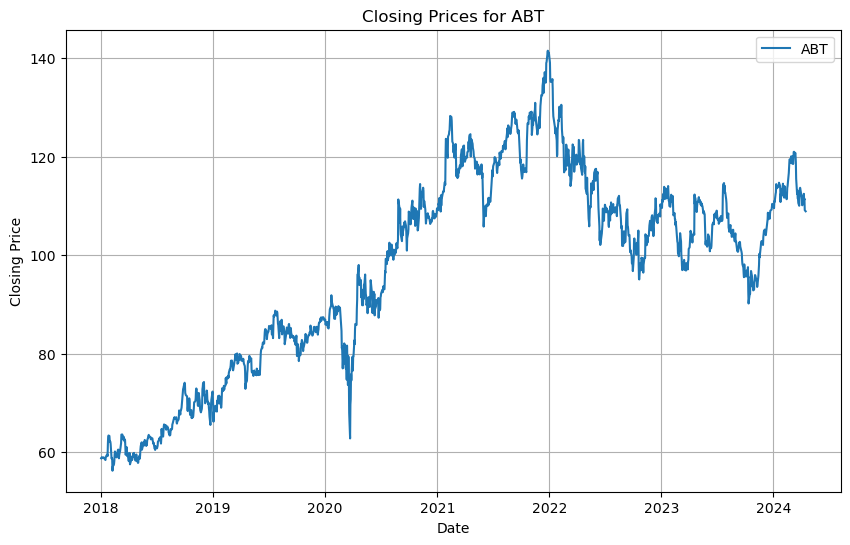

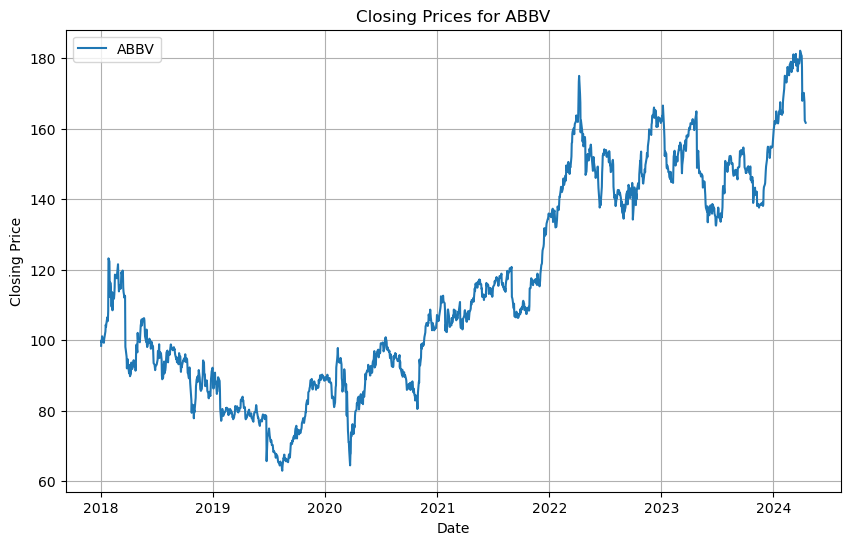

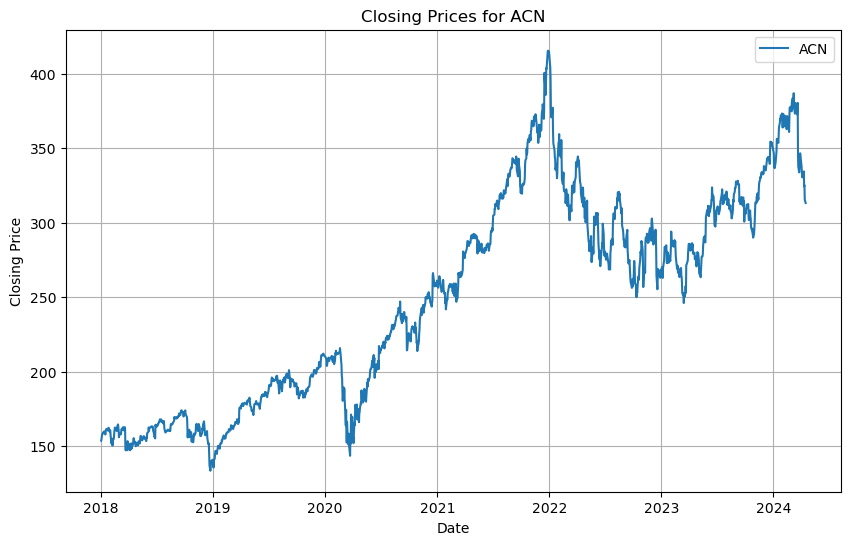

...

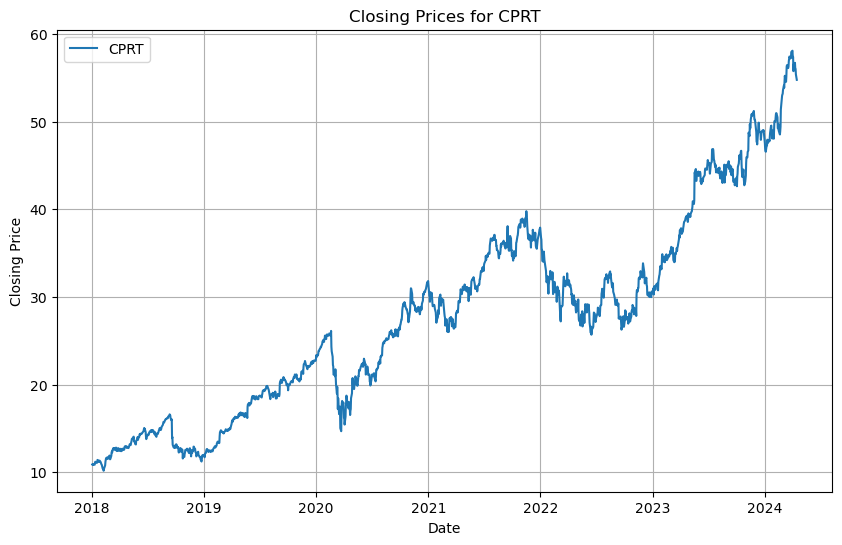

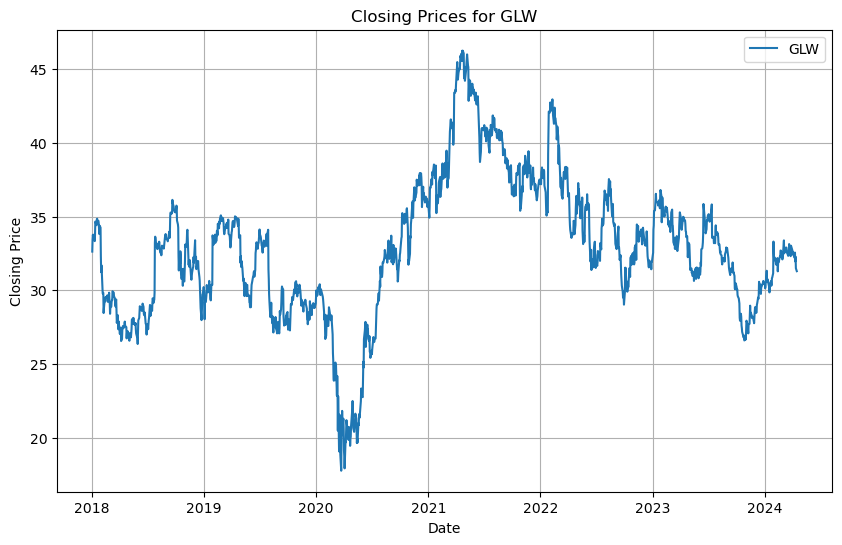

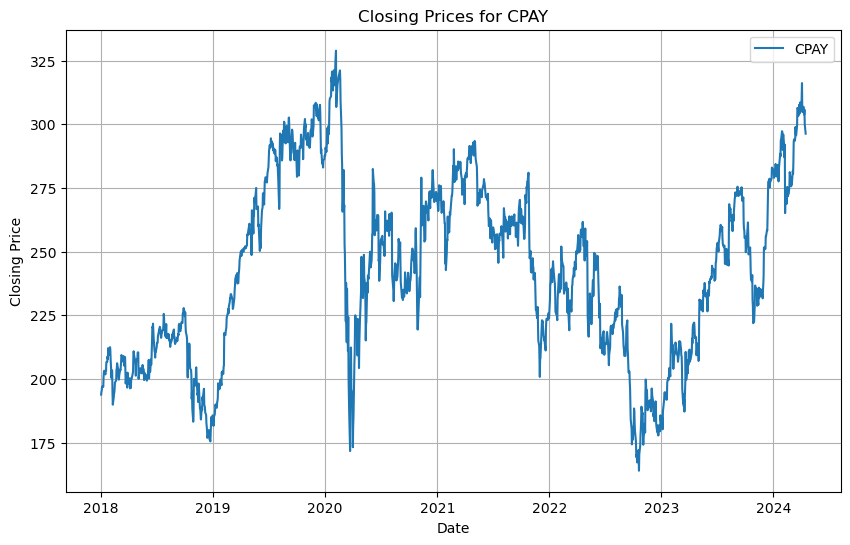

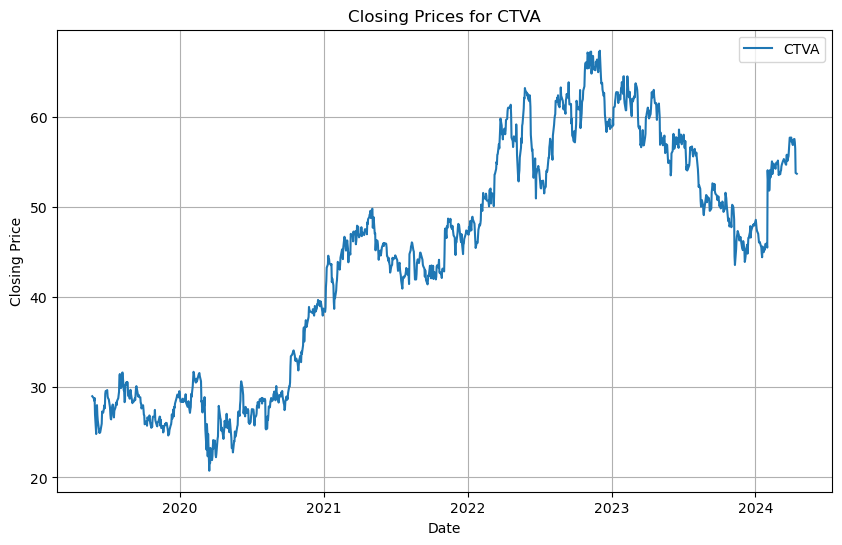

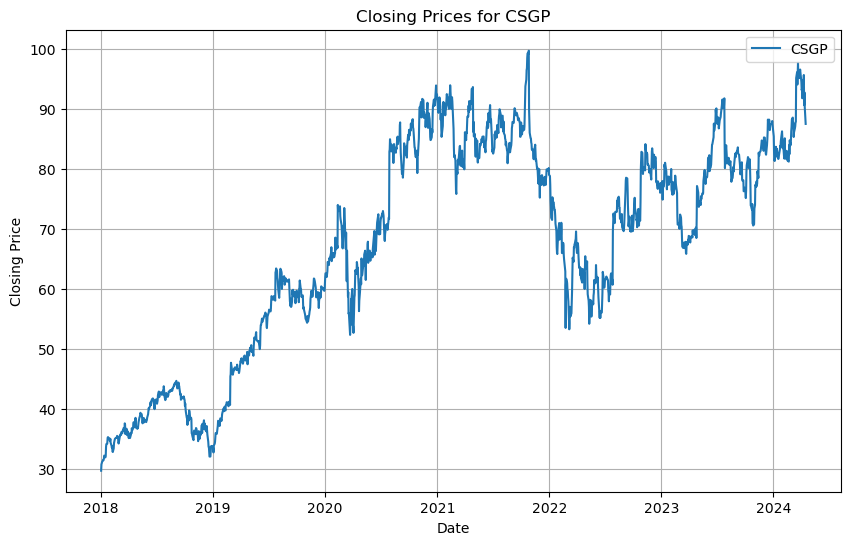

KeyboardInterrupt: 

In [14]:
# Loop through each ticker in the S&P 500 list
for ticker in sp500_tickers:
    # closing prices for the current ticker
    closing_prices = sp500_data[ticker]['Close']
    
    # Plot the closing prices
    plt.figure(figsize=(10, 6))
    plt.plot(closing_prices, label=ticker)
    plt.title(f"Closing Prices for {ticker}")
    plt.xlabel("Date")
    plt.ylabel("Closing Price")
    plt.legend()
    plt.grid(True)
    plt.show()

To analyze some of the data we are going to apply the 100 day and 200 day moving average to each ticker

In [ ]:
import matplotlib.pyplot as plt


for ticker in sp500_tickers:
    df = sp500_data[ticker]

    # Calculate the 100 and 200 day moving average
    ma100 = df.Close.rolling(100).mean()
    ma200 = df.Close.rolling(200).mean()
    plt.figure(figsize=(12, 6))
    plt.plot(df.Close, label=f'{ticker} Close Price')
    plt.plot(ma100, 'r', label='100-Day Moving Average')
    plt.plot(ma200, 'g', label='200-Day Moving Average')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.title(f'{ticker} Close Price with 100-Day Moving Average')
    plt.legend()
    plt.show()


## Feature engineering

### Scaling

We are going to scale the data using MinMaxScaler

The last row of the target column which should represent the stock movement that needs to be predicted is nan. We are going to remove that row from each ticker and apply the models

In [16]:
print(sp500_data['AAPL'].head)

<bound method NDFrame.head of                   Open        High         Low       Close   Adj Close  \
Date                                                                     
2018-01-02   42.540001   43.075001   42.314999   43.064999   40.670959   
2018-01-03   43.132500   43.637501   42.990002   43.057499   40.663902   
2018-01-04   43.134998   43.367500   43.020000   43.257500   40.852779   
2018-01-05   43.360001   43.842499   43.262501   43.750000   41.317894   
2018-01-08   43.587502   43.902500   43.482498   43.587502   41.164433   
...                ...         ...         ...         ...         ...   
2024-04-09  168.699997  170.080002  168.350006  169.669998  169.669998   
2024-04-10  168.800003  169.089996  167.110001  167.779999  167.779999   
2024-04-11  168.339996  175.460007  168.160004  175.039993  175.039993   
2024-04-12  174.259995  178.360001  174.210007  176.550003  176.550003   
2024-04-15  175.360001  176.630005  172.500000  172.690002  172.690002   

       

In [17]:
from sklearn.preprocessing import MinMaxScaler

scaled_sp500_data = {}

def scale_data_for_ticker(df):
    """Scales numeric columns in the DataFrame using MinMaxScaler."""
    # Copy of the original DataFrame to avoid modifying in place
    scaled_df = df.copy()
    
    # Initialize MinMaxScaler
    scaler = MinMaxScaler()
    
    # Get numeric columns excluding 'Close'
    numeric_cols = scaled_df.select_dtypes(include=['number']).columns.drop('Close')
    
    # Apply scaling to numeric columns if there are any numeric columns
    if numeric_cols.size > 0:
        scaled_df[numeric_cols] = scaler.fit_transform(scaled_df[numeric_cols])
    
    return scaled_df

# Scale data for each ticker
for ticker, df in sp500_data.items():
    scaled_sp500_data[ticker] = scale_data_for_ticker(df)


In [34]:
from sklearn.preprocessing import MinMaxScaler

def scale_data_for_ticker(ticker, df):
    # copy of the original DataFrame
    scaled_df = df.copy()
    
    # Initialize MinMaxScaler
    scaler = MinMaxScaler()
    
    # Get numeric columns excluding 'Close'
    numeric_cols = scaled_df.select_dtypes(include='number').columns
    
    # Apply scaling to numeric columns
    scaled_df[numeric_cols] = scaler.fit_transform(scaled_df[numeric_cols])
    
    return scaled_df, scaler


ticker_to_scale = 'AAPL' # change ticker to liking
scaled_sp500_data[ticker_to_scale] = scale_data_for_ticker(ticker_to_scale, sp500_data[ticker_to_scale])


In [19]:
# Check for nan values in each column
nan_counts = df.isna().sum()

# Print the number of NaN values in each column
print("Number of NaN values in each column:")
print(nan_counts)


Number of NaN values in each column:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


In [42]:
# Iterate over each ticker and its corresponding DataFrame
for ticker, df in sp500_data.items():
    # Drop the last rowd
    sp500_data[ticker] = df.drop(df.tail(1).index, inplace=False)

In [21]:
print(sp500_data['AAPL']) 

                  Open        High         Low       Close   Adj Close  \
Date                                                                     
2018-01-02   42.540001   43.075001   42.314999   43.064999   40.670959   
2018-01-03   43.132500   43.637501   42.990002   43.057499   40.663902   
2018-01-04   43.134998   43.367500   43.020000   43.257500   40.852779   
2018-01-05   43.360001   43.842499   43.262501   43.750000   41.317894   
2018-01-08   43.587502   43.902500   43.482498   43.587502   41.164433   
...                ...         ...         ...         ...         ...   
2024-04-08  169.029999  169.199997  168.240005  168.449997  168.449997   
2024-04-09  168.699997  170.080002  168.350006  169.669998  169.669998   
2024-04-10  168.800003  169.089996  167.110001  167.779999  167.779999   
2024-04-11  168.339996  175.460007  168.160004  175.039993  175.039993   
2024-04-12  174.259995  178.360001  174.210007  176.550003  176.550003   

               Volume  
Date         

For all of the following models we are going to apply it to all models but just pick the AAPL (Apple) stock and compare that for each of the applied models

## Linear Regression

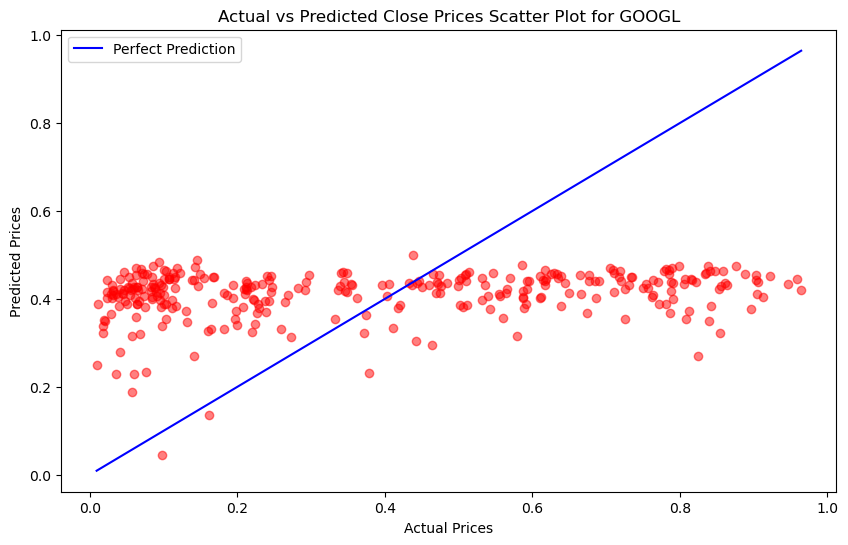

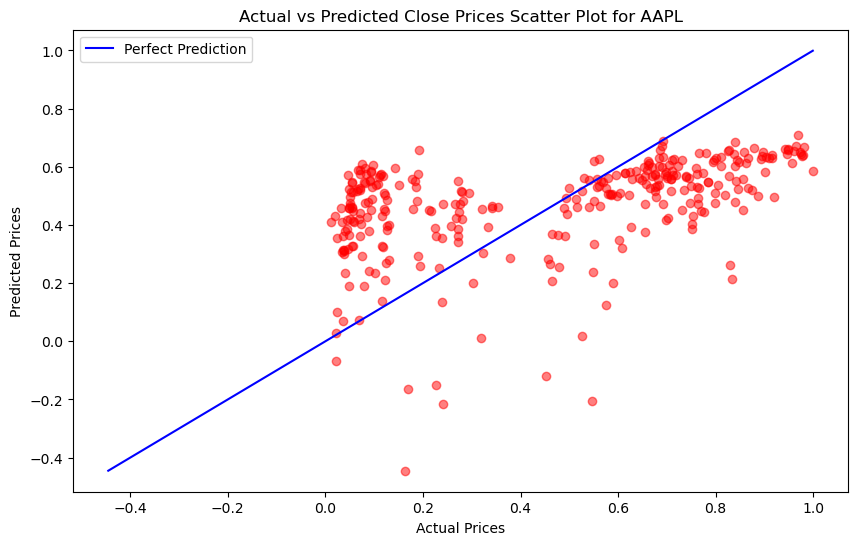

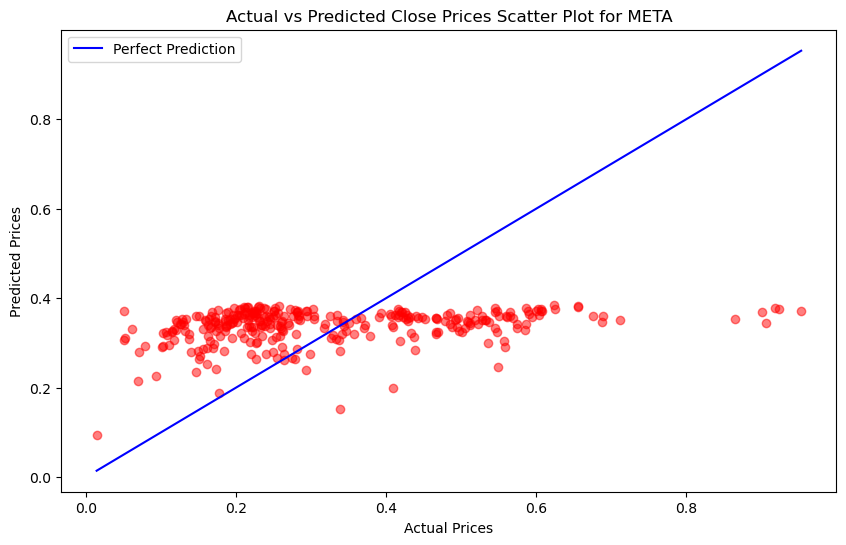

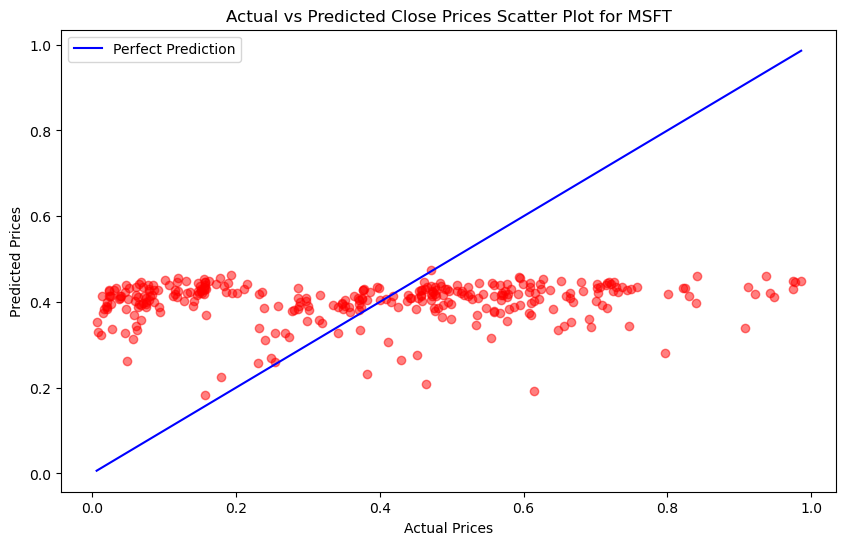

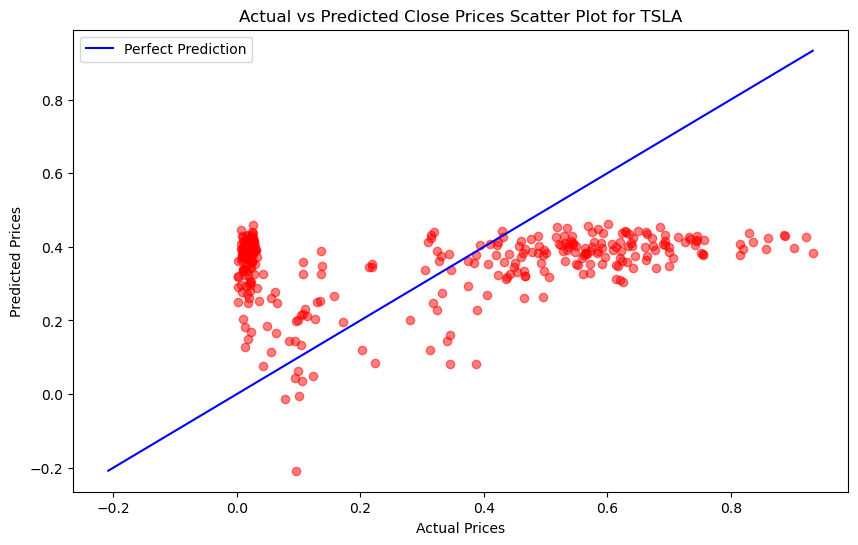

Ticker: GOOGL, Mean Squared Error: 0.08081899458337063
Ticker: AAPL, Mean Squared Error: 0.08038910623101238
Ticker: META, Mean Squared Error: 0.028259997262679904
Ticker: MSFT, Mean Squared Error: 0.06348033790334785
Ticker: TSLA, Mean Squared Error: 0.07068032683411422


In [43]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Dictionary to store the models and evaluation results


selected_tickers = ['AAPL', 'GOOGL', 'MSFT', 'TSLA','META']

models = {}

# Iterate over each ticker and its corresponding DataFrame
for ticker, df in sp500_data.items():
    if ticker in selected_tickers:
        # Scale the data first
        scaled_df, scaler = scale_data_for_ticker(ticker, df)

        # Separate features and target variable
        X = scaled_df.drop(columns=['Close', 'High', 'Low', 'Adj Close', 'Open'])
        y = scaled_df['Close']

        # Split the data into training and testing sets
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

        # Initialize Linear Regression model
        model = LinearRegression()

        # Fit the model to the training data
        model.fit(X_train, y_train)

        # Evaluate the model on the testing data
        y_pred = model.predict(X_test)
        mse = mean_squared_error(y_test, y_pred)

        # Store the model and evaluation results
        models[ticker] = {'model': model, 'mse': mse, 'y_test': y_test, 'y_pred': y_pred}


# Plot scatter and perfect prediction line
for ticker, info in models.items():
    plt.figure(figsize=(10, 6))
    plt.scatter(info['y_test'], info['y_pred'], alpha=0.5, color='red')
    plt.title(f'Actual vs Predicted Close Prices Scatter Plot for {ticker}')
    plt.xlabel('Actual Prices')
    plt.ylabel('Predicted Prices')
    perfect_prediction = [min(info['y_test'].min(), info['y_pred'].min()), max(info['y_test'].max(), info['y_pred'].max())]
    plt.plot(perfect_prediction, perfect_prediction, color='blue', linestyle='-', label='Perfect Prediction')
    plt.legend()
    plt.show()
        
        

# Access individual model and evaluation results
for ticker, info in models.items():
    print(f"Ticker: {ticker}, Mean Squared Error: {info['mse']}")

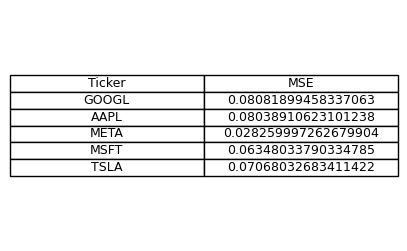

In [44]:
data = {ticker: info['mse'] for ticker, info in models.items()}

# Convert the dictionary to a DataFrame for easier handling
df = pd.DataFrame(list(data.items()), columns=['Ticker', 'MSE'])

# Create a figure and an axis
fig, ax = plt.subplots(figsize=(5, 3))

# Hide the axes
ax.axis('tight')
ax.axis('off')

# Create the table
# how to create table taken from https://matplotlib.org/stable/gallery/misc/table_demo.html#sphx-glr-gallery-misc-table-demo-py
table = ax.table(cellText=df.values, colLabels=df.columns, loc='center', cellLoc='center')
 
# Show the figure
plt.show()

## Random Forest Regressor

                Open      High       Low     Close  Adj Close    Volume
Date                                                                   
2018-01-02  0.031896  0.029274  0.035026  0.040181   0.040181  0.181277
2018-01-03  0.041604  0.038497  0.044512  0.048490   0.048490  0.177660
2018-01-04  0.052357  0.042155  0.054194  0.050415   0.050415  0.135146
2018-01-05  0.055309  0.046510  0.057698  0.057009   0.057009  0.169038
2018-01-08  0.058815  0.049068  0.061509  0.058787   0.058787  0.123779
Fitting 5 folds for each of 12 candidates, totalling 60 fits


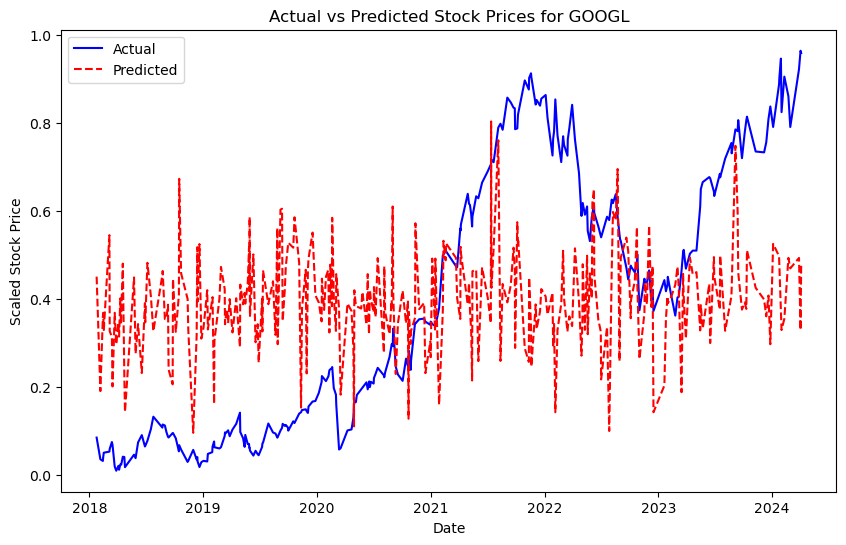

                Open      High       Low     Close  Adj Close    Volume
Date                                                                   
2018-01-02  0.040395  0.040719  0.042198  0.046244   0.040270  0.194243
2018-01-03  0.044052  0.044166  0.046378  0.046198   0.040227  0.233620
2018-01-04  0.044067  0.042512  0.046563  0.047428   0.041380  0.163221
2018-01-05  0.045456  0.045423  0.048065  0.050458   0.044220  0.175400
2018-01-08  0.046860  0.045790  0.049427  0.049458   0.043283  0.144667
Fitting 5 folds for each of 12 candidates, totalling 60 fits


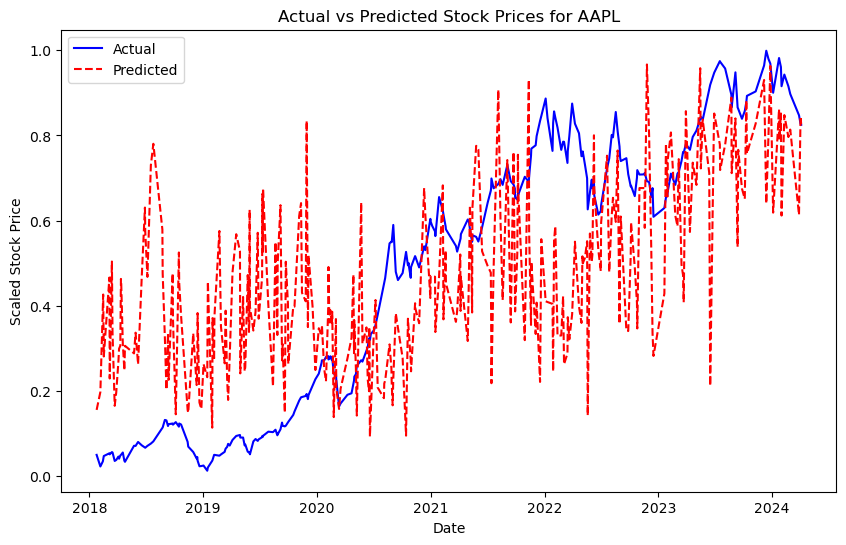

                Open      High       Low     Close  Adj Close    Volume
Date                                                                   
2018-01-02  0.000204  0.000000  0.004864  0.002730   0.002501  0.131973
2018-01-03  0.000000  0.000581  0.006233  0.003891   0.003565  0.166961
2018-01-04  0.001542  0.003919  0.007981  0.006098   0.005588  0.126381
2018-01-05  0.004654  0.006096  0.010486  0.009235   0.008461  0.141002
2018-01-08  0.006225  0.006589  0.010981  0.009496   0.008701  0.128346
Fitting 5 folds for each of 12 candidates, totalling 60 fits


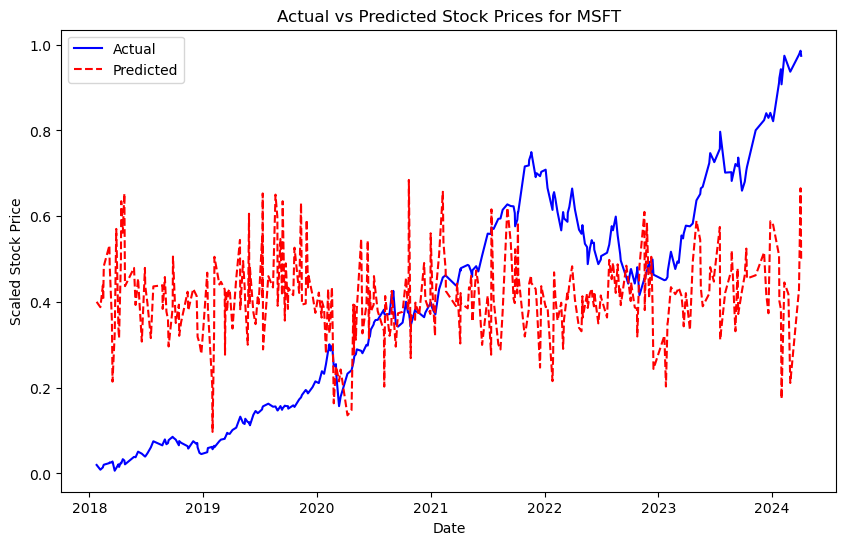

                Open      High       Low     Close  Adj Close    Volume
Date                                                                   
2018-01-02  0.021850  0.022457  0.022683  0.023710   0.023710  0.040558
2018-01-03  0.023352  0.022977  0.023453  0.023160   0.023160  0.043429
2018-01-04  0.021995  0.021866  0.021782  0.022720   0.022720  0.135408
2018-01-05  0.022621  0.021649  0.022852  0.023048   0.023048  0.044611
2018-01-08  0.022517  0.024929  0.023444  0.026369   0.026369  0.133934
Fitting 5 folds for each of 12 candidates, totalling 60 fits


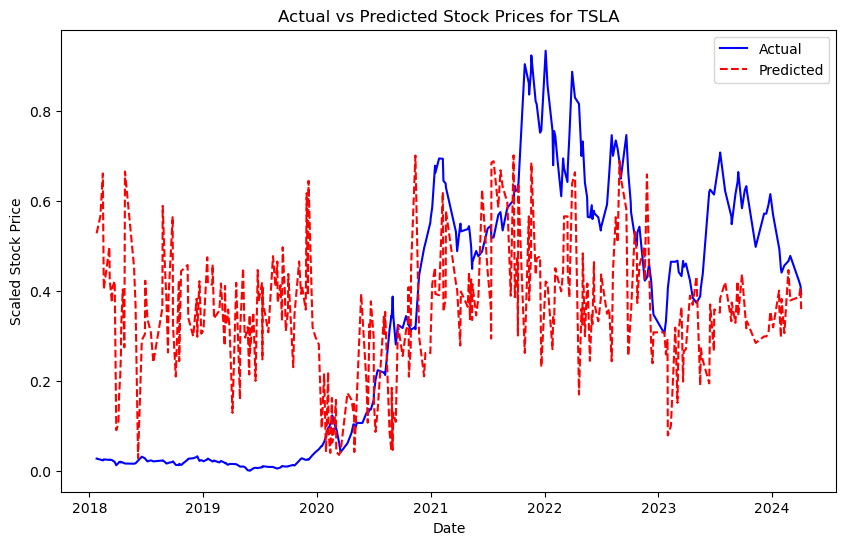

                Open      High       Low     Close  Adj Close    Volume
Date                                                                   
2018-01-02  0.199454  0.206607  0.207660  0.211003   0.210734  0.055916
2018-01-03  0.209016  0.213863  0.216435  0.218416   0.218137  0.050338
2018-01-04  0.215893  0.217105  0.222864  0.217640   0.217363  0.037088
2018-01-05  0.217464  0.218670  0.224791  0.223388   0.223103  0.035737
2018-01-08  0.221129  0.223205  0.228041  0.226650   0.226361  0.055223
Fitting 5 folds for each of 12 candidates, totalling 60 fits


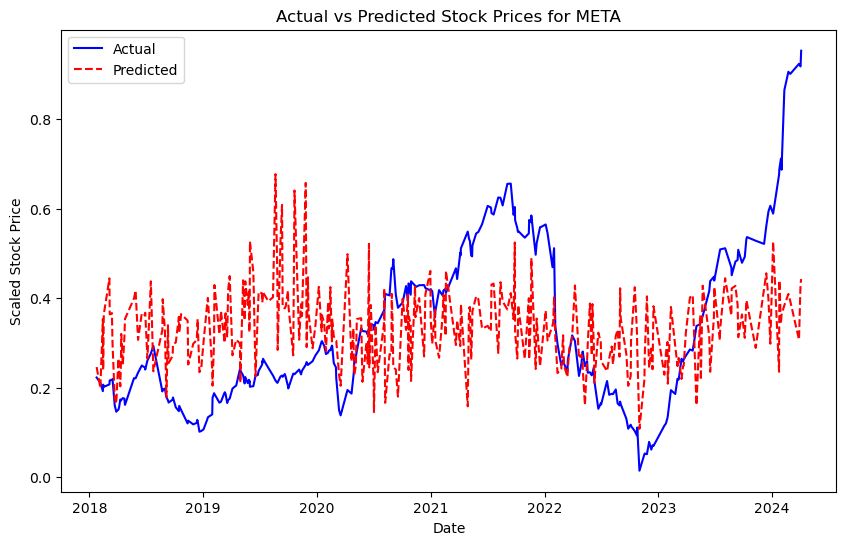

Ticker: GOOGL, Best Parameters: {'max_depth': 10, 'min_samples_split': 5, 'n_estimators': 200}, Mean Squared Error: 0.08704643884570264
Ticker: AAPL, Best Parameters: {'max_depth': 10, 'min_samples_split': 5, 'n_estimators': 200}, Mean Squared Error: 0.07189618483606364
Ticker: MSFT, Best Parameters: {'max_depth': 10, 'min_samples_split': 5, 'n_estimators': 200}, Mean Squared Error: 0.06997366299724486
Ticker: TSLA, Best Parameters: {'max_depth': 10, 'min_samples_split': 5, 'n_estimators': 100}, Mean Squared Error: 0.07748824707045948
Ticker: META, Best Parameters: {'max_depth': 10, 'min_samples_split': 5, 'n_estimators': 100}, Mean Squared Error: 0.0312710446119446


In [45]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import pandas as pd

# where each DataFrame has been scaled using MinMaxScaler
selected_tickers = ['GOOGL', 'AAPL', 'MSFT', 'TSLA', 'META']

# Dictionary to store the best models and their evaluation results
best_models = {}

# Iterate over each selected ticker
for ticker_to_scale in selected_tickers:
    # Get the scaled DataFrame for the ticker
    scaled_df, scaler = scale_data_for_ticker(ticker_to_scale, sp500_data[ticker_to_scale])
    
    print(scaled_df.head())

    # Separate features and target variable
    X = scaled_df.drop(columns=['Close', 'High', 'Low', 'Adj Close', 'Open'])
    y = scaled_df['Close']

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Parameter grid for GridSearchCV
    param_grid = {
        'n_estimators': [100, 200], 
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5]
    }

    # Initialize the GridSearchCV object
    grid_search = GridSearchCV(estimator=RandomForestRegressor(random_state=42),
                               param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)

    # Fit the grid search to the data
    grid_search.fit(X_train, y_train)

    # Best parameters and model
    best_params = grid_search.best_params_
    best_model = grid_search.best_estimator_

    # Predict on the testing data using the best model
    y_pred = best_model.predict(X_test)

    # Calculate the Mean Squared Error
    mse = mean_squared_error(y_test, y_pred)

    # Store the best model and its MSE
    best_models[ticker_to_scale] = {'model': best_model, 'mse': mse, 'params': best_params}

    # Plotting Actual vs Predicted Prices
    df_plot = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred}, index=y_test.index)
    df_plot.sort_index(inplace=True)

    plt.figure(figsize=(10, 6))
    plt.plot(df_plot['Actual'], label='Actual', color='blue')
    plt.plot(df_plot['Predicted'], label='Predicted', color='red', linestyle='--')
    plt.title(f'Actual vs Predicted Stock Prices for {ticker_to_scale}')
    plt.xlabel('Date')
    plt.ylabel('Scaled Stock Price')
    plt.legend()
    plt.show()

# Output the results
for ticker, model_info in best_models.items():
    print(f"Ticker: {ticker}, Best Parameters: {model_info['params']}, Mean Squared Error: {model_info['mse']}")

## Random Forest Regressor Improved

Fitting 5 folds for each of 12 candidates, totalling 60 fits


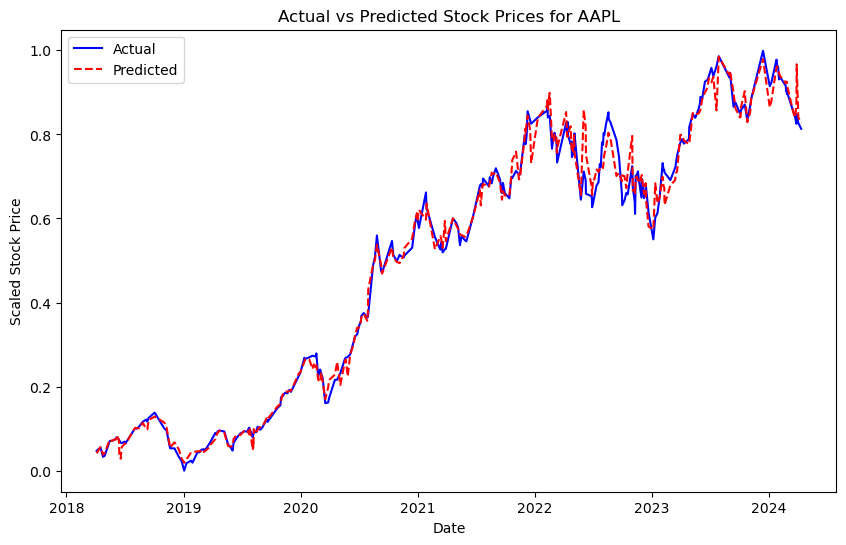

Fitting 5 folds for each of 12 candidates, totalling 60 fits


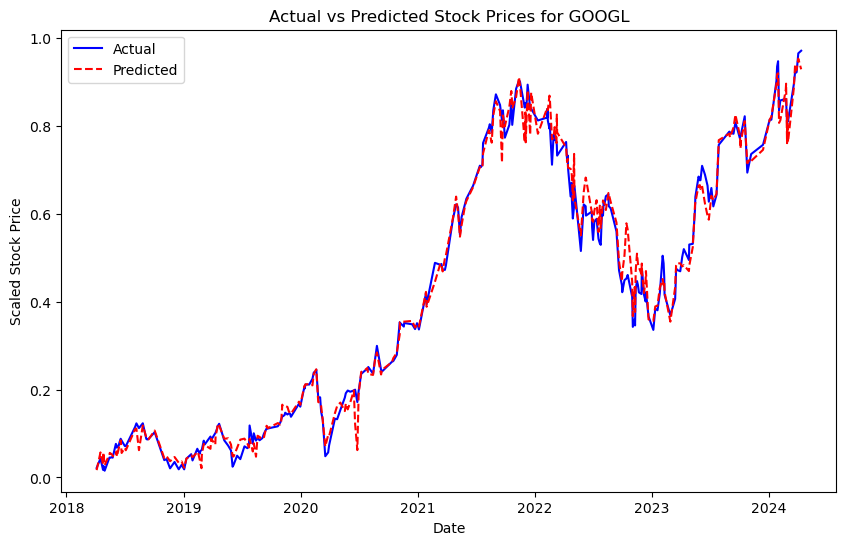

Fitting 5 folds for each of 12 candidates, totalling 60 fits


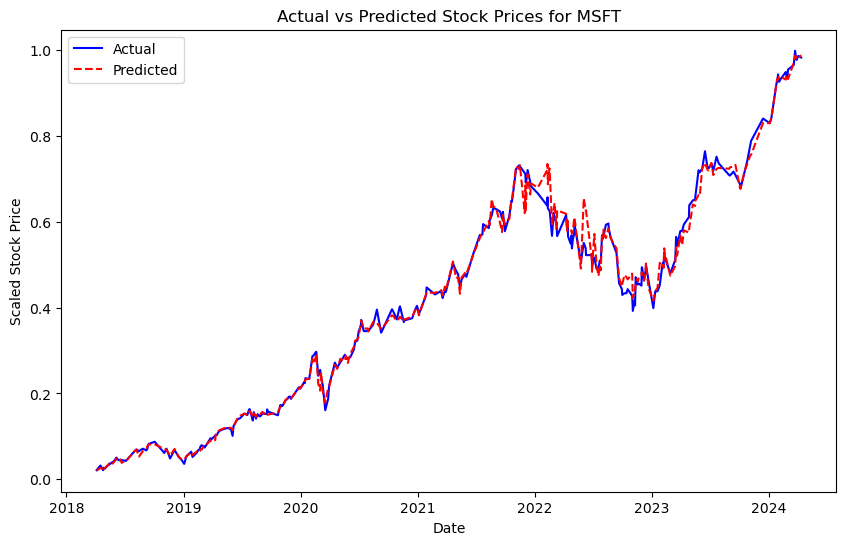

Fitting 5 folds for each of 12 candidates, totalling 60 fits


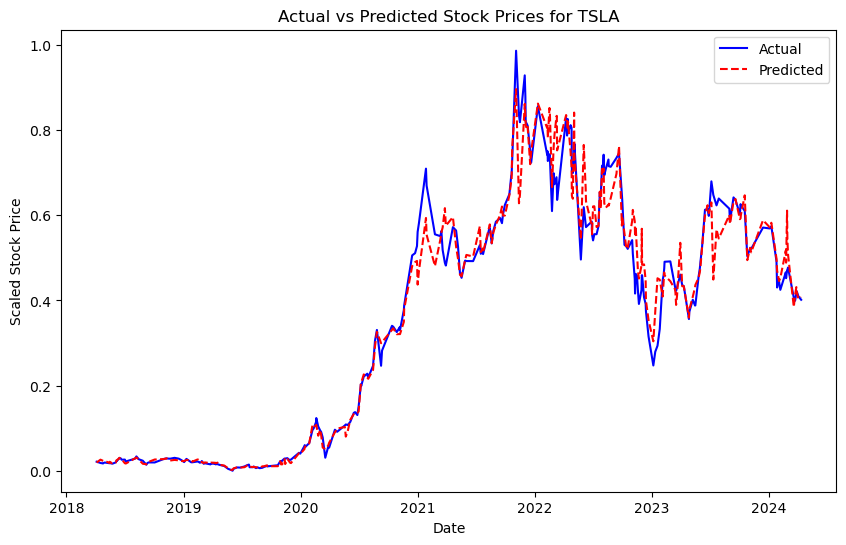

Fitting 5 folds for each of 12 candidates, totalling 60 fits


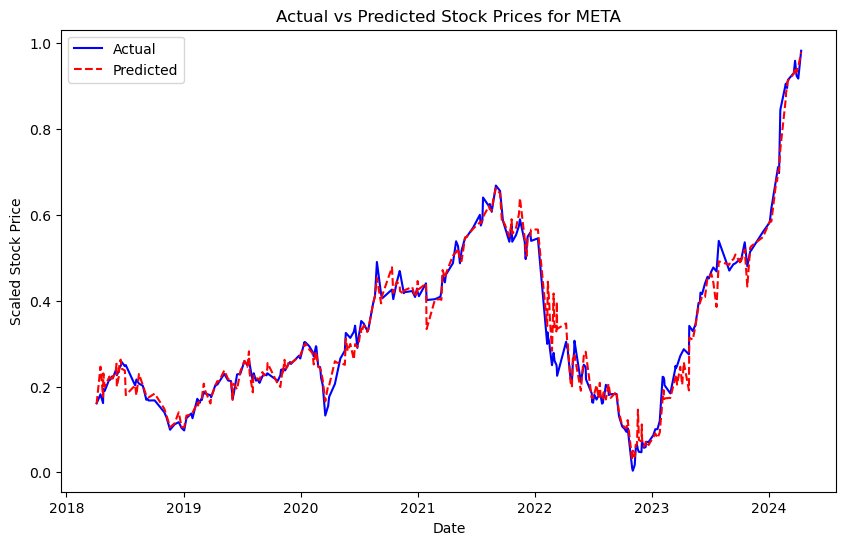

Ticker: AAPL, Best Parameters: {'max_depth': 10, 'min_samples_split': 2, 'n_estimators': 200}, Mean Squared Error: 0.000838068194373309
Ticker: GOOGL, Best Parameters: {'max_depth': 20, 'min_samples_split': 2, 'n_estimators': 100}, Mean Squared Error: 0.0008869205623724073
Ticker: MSFT, Best Parameters: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 100}, Mean Squared Error: 0.00048632741651207537
Ticker: TSLA, Best Parameters: {'max_depth': 20, 'min_samples_split': 2, 'n_estimators': 100}, Mean Squared Error: 0.0022832919642080023
Ticker: META, Best Parameters: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}, Mean Squared Error: 0.0008435154584735794


In [46]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import pandas as pd

def calculate_moving_average(data, window_size):
    return data['Close'].rolling(window=window_size).mean()

def calculate_rsi(data, periods=14):
    delta = data['Close'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=periods).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=periods).mean()

    rs = gain / loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

# where each DataFrame has been scaled using MinMaxScaler
selected_tickers = ['AAPL', 'GOOGL', 'MSFT', 'TSLA', 'META']

# Dictionary to store the best models and their evaluation results
best_models = {}

# Iterate over each selected ticker
for ticker_to_scale in selected_tickers:
    # Get the scaled DataFrame for the ticker
    scaled_df, scaler = scale_data_for_ticker(ticker_to_scale, sp500_data[ticker_to_scale])

    # Calculate moving average and RSI
    scaled_df['MA_50'] = calculate_moving_average(scaled_df, 50) 
    scaled_df['RSI'] = calculate_rsi(scaled_df)

    # Drop the first 'periods' rows because of NaN values after calculating RSI
    scaled_df = scaled_df.dropna()

    # Separate features and target variable
    X = scaled_df.drop(columns=['Close', 'High', 'Low', 'Adj Close', 'Open']) 
    y = scaled_df['Close']

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Parameter grid for GridSearchCV
    param_grid = {
        'n_estimators': [100, 200], 
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5]
    }

    # Initialize the GridSearchCV object
    grid_search = GridSearchCV(estimator=RandomForestRegressor(random_state=42),
                               param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)

    # Fit the grid search to the data
    grid_search.fit(X_train, y_train)

    # Best parameters and model
    best_params = grid_search.best_params_
    best_model = grid_search.best_estimator_

    # Predict on the testing data using the best model
    y_pred = best_model.predict(X_test)

    # Calculate the Mean Squared Error
    mse = mean_squared_error(y_test, y_pred)

    # Store the best model and its MSE
    best_models[ticker_to_scale] = {'model': best_model, 'mse': mse, 'params': best_params}

    # Plotting Actual vs Predicted Prices
    df_plot = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred}, index=y_test.index)
    df_plot.sort_index(inplace=True)

    plt.figure(figsize=(10, 6))
    plt.plot(df_plot['Actual'], label='Actual', color='blue')
    plt.plot(df_plot['Predicted'], label='Predicted', color='red', linestyle='--')
    plt.title(f'Actual vs Predicted Stock Prices for {ticker_to_scale}')
    plt.xlabel('Date')
    plt.ylabel('Scaled Stock Price')
    plt.legend()
    plt.show()

# Output the results
for ticker, model_info in best_models.items():
    print(f"Ticker: {ticker}, Best Parameters: {model_info['params']}, Mean Squared Error: {model_info['mse']}")

In [27]:
print(y.shape)

(1531,)


In [28]:
print(X.shape)

(1531, 3)


In [29]:
print(models['TSLA'])

{'model': LinearRegression(), 'mse': 0.0708451295697083, 'y_test': Date
2022-12-02    0.459575
2021-03-26    0.488157
2022-08-31    0.662445
2020-02-18    0.113796
2020-01-17    0.055527
                ...   
2022-05-26    0.562706
2022-10-25    0.528815
2022-07-20    0.591824
2023-07-17    0.699552
2024-04-04    0.399908
Name: Close, Length: 316, dtype: float64, 'y_pred': array([ 0.4156894 ,  0.38245585,  0.44133397,  0.21080572,  0.25996577,
        0.34347928, -0.01465257,  0.38295163,  0.25118069,  0.26190889,
        0.15984329,  0.42607053,  0.43245423,  0.43135908,  0.37210472,
        0.14473451,  0.31919144,  0.31003452,  0.42193177,  0.43281713,
        0.40109092,  0.36448658, -0.20887638,  0.1195812 ,  0.38550911,
        0.40940011,  0.37851604,  0.41181793,  0.36950617,  0.14245028,
        0.12830021,  0.4271921 ,  0.37375827,  0.40239062,  0.43923369,
        0.36052296,  0.41076601,  0.20398875,  0.32574945,  0.42364806,
        0.38101209,  0.40260065,  0.46069938,  

## RNN

### Data Preparation

In [54]:
apple_df = sp500_data['AAPL']['Close']
print(apple_df)

Date
2018-01-02     43.064999
2018-01-03     43.057499
2018-01-04     43.257500
2018-01-05     43.750000
2018-01-08     43.587502
                 ...    
2024-04-05    169.580002
2024-04-08    168.449997
2024-04-09    169.669998
2024-04-10    167.779999
2024-04-11    175.039993
Name: Close, Length: 1579, dtype: float64


For the recurrent neural network models are going to have a create sequence method which will create sequences

**NOTE: To underatand the concept of sequencing in LSTM's information has been observed and applied from a youtube video. I merely applied the concept of sequencing over to the code (reused code). The link to the video is the following: https://youtu.be/s3CnE2tqQdo?si=K2y-d52HTZUevuqu**

In [63]:
from sklearn.preprocessing import MinMaxScaler
import pandas as pd

def scale__RNN_LSTM(ticker, df):
    # Initialize MinMaxScaler
    scaler = MinMaxScaler()
    
    # Scale the 'Close' column
    scaled_values = scaler.fit_transform(df[['Close']])  # Fit and transform the 'Close' column
    
    # Create a new DataFrame with scaled values for integration
    scaled_df = df.copy()
    scaled_df['Close'] = scaled_values.flatten()  # Assign scaled values back to the 'Close' column
    
    return scaled_df, scaler

In [64]:
# Create sequences for prediction
def create_sequences(data, sequence_length):
    X, y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:i+sequence_length])
        y.append(data[i+sequence_length])
    return np.array(X), np.array(y)

In [65]:
# Define a function to plot loss curve
# This exact function is taken from the INTRODUCTION TO ARTIFICIAL INTELLIGENCE coursework
def plot_loss(history):
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

Training on AAPL
Epoch 1/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.1150 - val_loss: 0.0011
Epoch 2/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0044 - val_loss: 0.0021
Epoch 3/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0018 - val_loss: 0.0010
Epoch 4/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0015 - val_loss: 9.0252e-04
Epoch 5/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0013 - val_loss: 8.5751e-04
Epoch 6/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0011 - val_loss: 7.8909e-04
Epoch 7/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 8.9358e-04 - val_loss: 7.4109e-04
Epoch 8/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 6.8630e-04 - val_loss: 7.4599e-04
Epoch 9/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 5.3389e-04 - val_loss: 7.1494e-04
Epoch 10/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 4.4077e-04 - val_loss: 6.8166e-04
Epoch 11/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 3.9784e-04 - val_loss: 6.6512e-04
Epoc

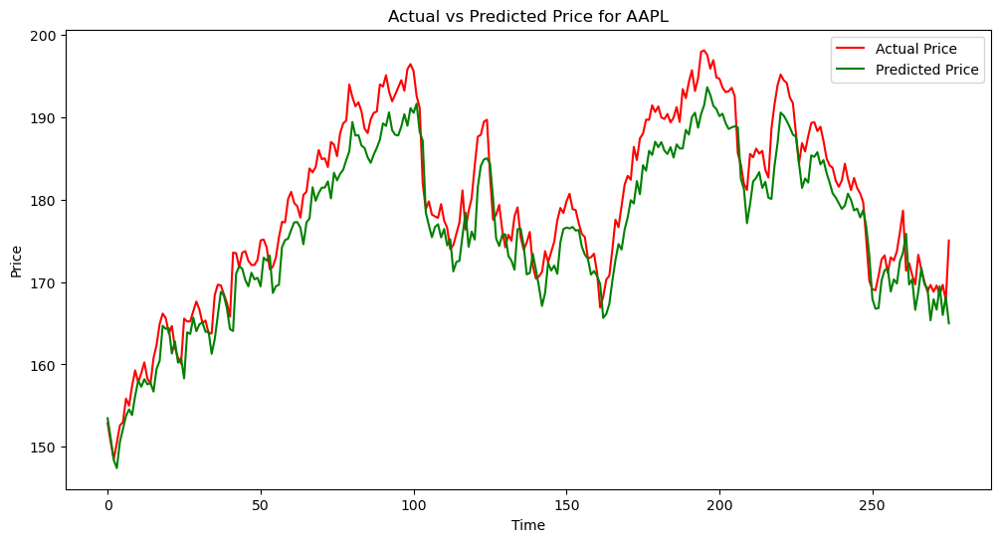

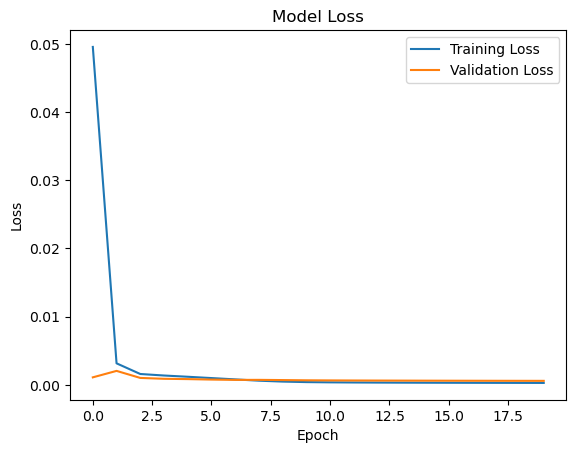

Training on GOOGL
Epoch 1/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.2420 - val_loss: 0.0039
Epoch 2/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0122 - val_loss: 0.0047
Epoch 3/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0039 - val_loss: 0.0058
Epoch 4/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0034 - val_loss: 0.0053
Epoch 5/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0030 - val_loss: 0.0051
Epoch 6/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0026 - val_loss: 0.0048
Loss for GOOGL: 0.025202078744769096
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


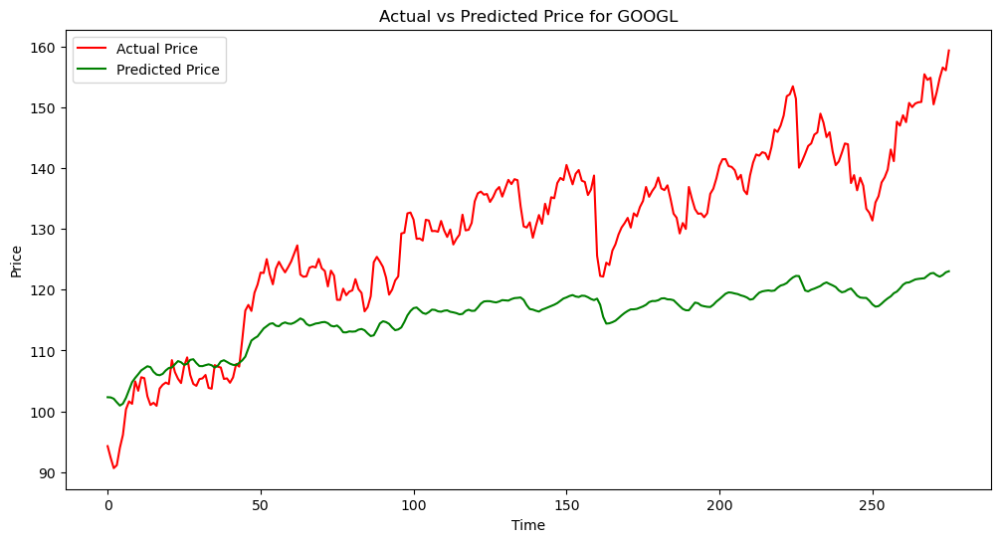

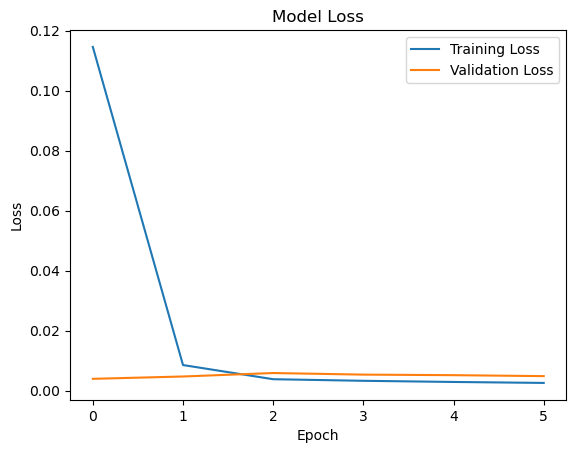

Training on MSFT
Epoch 1/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0095 - val_loss: 0.0035
Epoch 2/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0010 - val_loss: 0.0016
Epoch 3/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 4.7678e-04 - val_loss: 0.0011
Epoch 4/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 4.0586e-04 - val_loss: 9.4077e-04
Epoch 5/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 4.0569e-04 - val_loss: 7.2938e-04
Epoch 6/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 3.6155e-04 - val_loss: 6.8971e-04
Epoch 7/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 3.2612e-04 - val_loss: 6.7469e-04
Epoch 8/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 3.1145e-04 - val_loss: 6.6196e-04
Epoch 9/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 3.0105e-04 - val_loss: 6.5574e-04
Epoch 10/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 2.9338e-04 - val_loss: 6.5020e-04
Epoch 11/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 2.8643e-04 - val_loss:

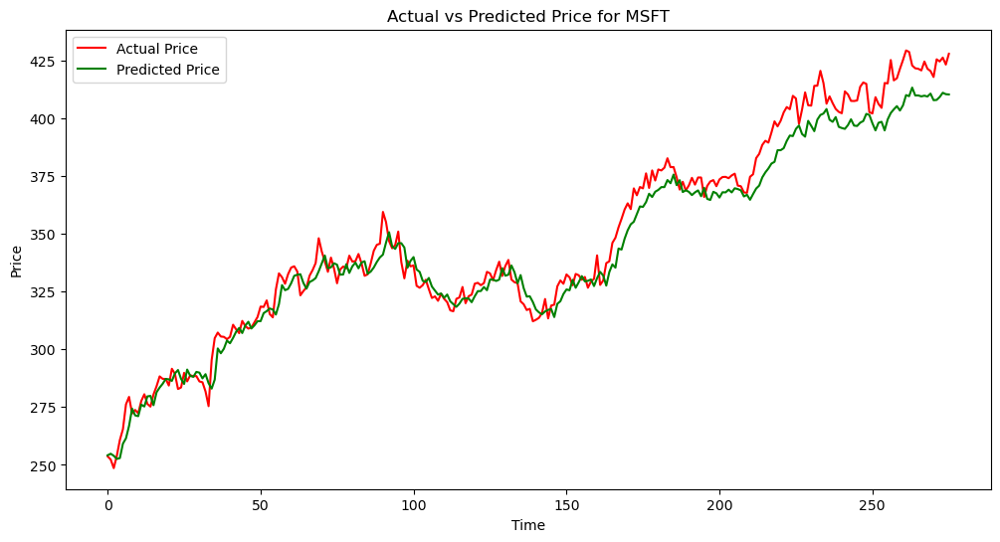

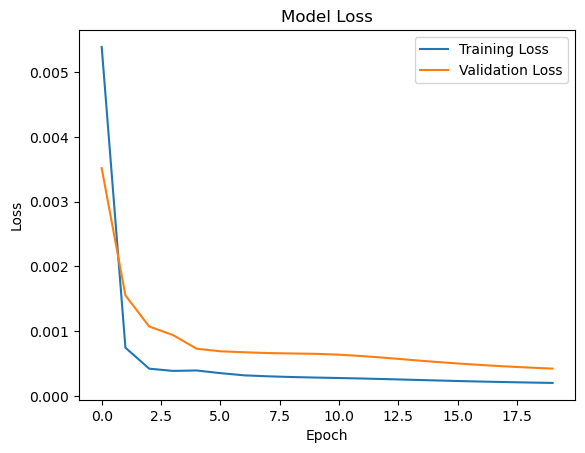

Training on TSLA
Epoch 1/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0086 - val_loss: 0.0010
Epoch 2/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 6.5469e-04 - val_loss: 9.1972e-04
Epoch 3/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 5.3103e-04 - val_loss: 8.6216e-04
Epoch 4/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 5.0189e-04 - val_loss: 7.6062e-04
Epoch 5/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 4.8495e-04 - val_loss: 6.7479e-04
Epoch 6/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 4.9046e-04 - val_loss: 6.3288e-04
Epoch 7/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 5.0378e-04 - val_loss: 6.2795e-04
Epoch 8/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 5.1227e-04 - val_loss: 6.2049e-04
Epoch 9/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 5.1028e-04 - val_loss: 6.1365e-04
Epoch 10/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 4.9810e-04 - val_loss: 6.1232e-04
Epoch 11/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 4.8442e-04

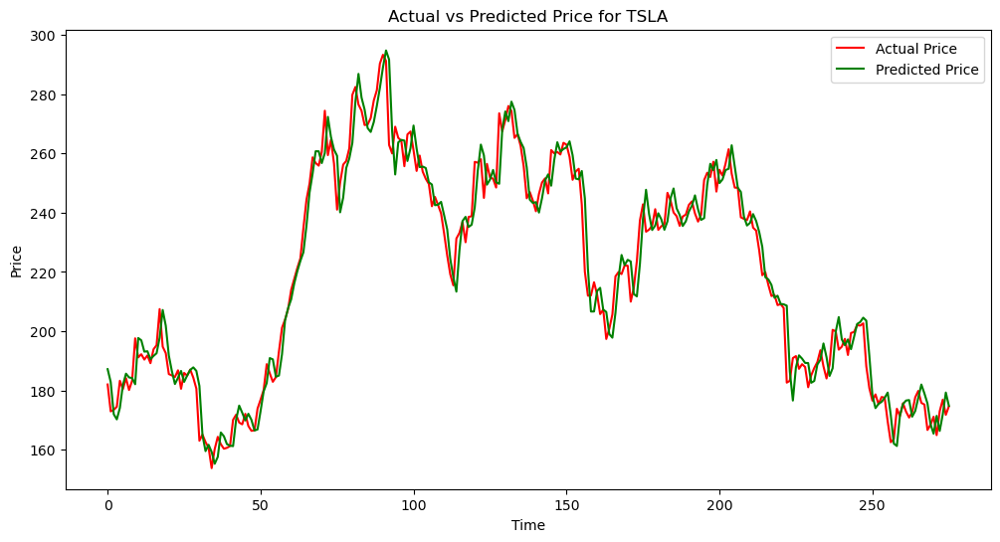

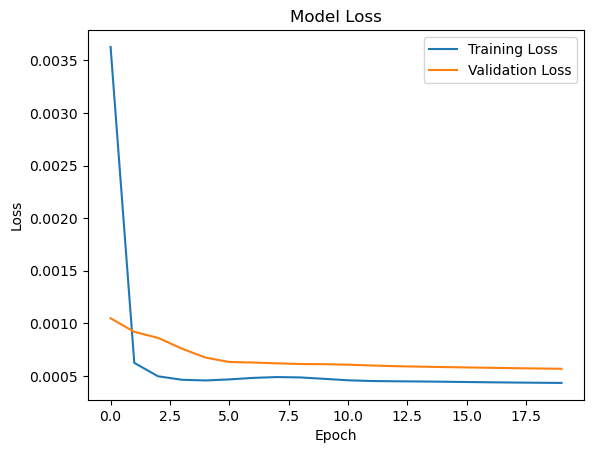

Training on META
Epoch 1/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.2897 - val_loss: 0.0602
Epoch 2/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0294 - val_loss: 0.0636
Epoch 3/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0188 - val_loss: 0.0368
Epoch 4/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0101 - val_loss: 0.0138
Epoch 5/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0087 - val_loss: 0.0614
Epoch 6/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0041 - val_loss: 0.0236
Epoch 7/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0025 - val_loss: 0.0235
Epoch 8/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0023 - val_loss: 0.0182
Epoch 9/20
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0021 - val_loss: 0.0179
Loss for META: 0.03271855413913727
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


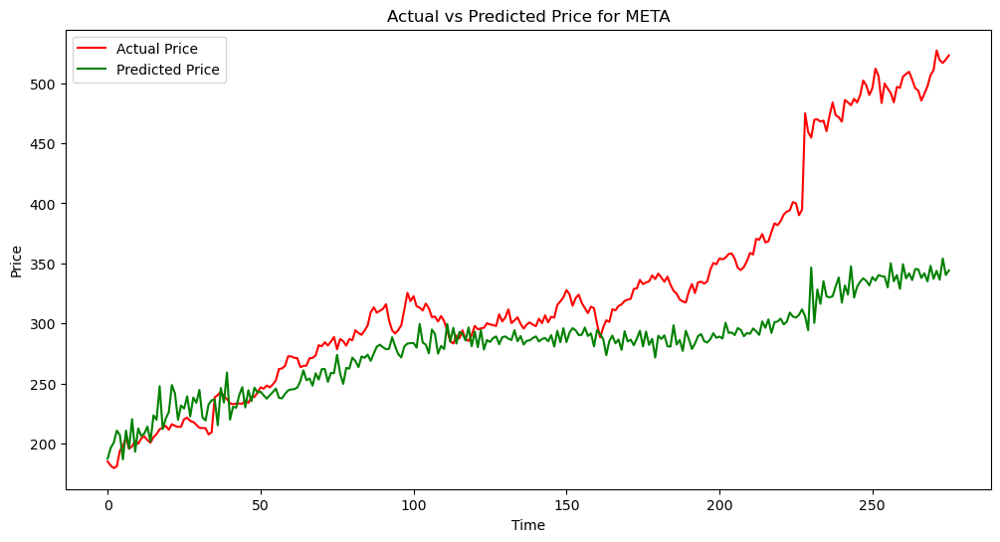

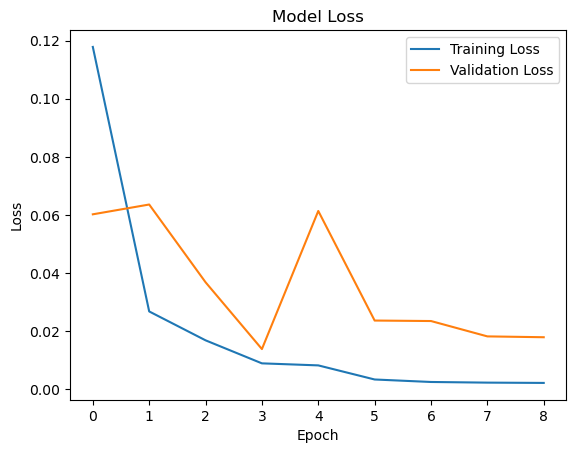

In [77]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense, Dropout
from tensorflow.keras.initializers import Orthogonal
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Input
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt

mse_initial = {}

# Tickers to model
tickers = ['AAPL', 'GOOGL', 'MSFT', 'TSLA', 'META']

# Loop over each ticker
for ticker in tickers:
    print(f"Training on {ticker}")
    # Get the scaled DataFrame for the ticker
    
    df, scaler = scale__RNN_LSTM(ticker, sp500_data[ticker])
    scaled_df = df['Close'].values.reshape(-1,1)

    # Define sequence length and create sequences
    sequence_length = 200
    X, y = create_sequences(scaled_df, sequence_length)

    # Split data into train and test sets
    split_index = int(len(X) * 0.8)
    X_train, X_test = X[:split_index], X[split_index:]
    y_train, y_test = y[:split_index], y[split_index:]

    if ticker == 'AAPL':
        # Build the RNN model for Apple
        model = Sequential([
            Input(shape=(sequence_length, 1)),
            SimpleRNN(units=5, return_sequences=False, kernel_initializer=Orthogonal(gain=1.0, seed=42)),
            Dense(units=1)
        ])
        # Compile and fit the model
        model.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error')
        history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_split=0.2, verbose=1, callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)])
    
    if ticker == 'GOOGL':
        # Build the RNN model for Google
        model = Sequential([
            Input(shape=(sequence_length, 1)),
            SimpleRNN(units=5, return_sequences=False, kernel_initializer=Orthogonal(gain=1.0, seed=42)),
            Dense(units=1)
        ])
        # Compile and fit the model
        model.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error')
        history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_split=0.2, verbose=1, callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)])
        
    if ticker == 'MSFT':
        # Build the RNN model for Microsoft
        model = Sequential([
            Input(shape=(sequence_length, 1)),
            SimpleRNN(units=5, return_sequences=False, kernel_initializer=Orthogonal(gain=1.0, seed=42)),
            Dense(units=1)
        ])
        # Compile and fit the model
        model.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error')
        history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_split=0.2, verbose=1, callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)])
        
    if ticker == 'TSLA':
        # Build the RNN model for Tesla
        model = Sequential([
            Input(shape=(sequence_length, 1)),
            SimpleRNN(units=5, return_sequences=False, kernel_initializer=Orthogonal(gain=1.0, seed=42)),
            Dense(units=1)
        ])
        # Compile and fit the model
        model.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error')
        history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_split=0.2, verbose=1, callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)])
    
    if ticker == 'META':
        # Build the RNN model for Meta
        model = Sequential([
            Input(shape=(sequence_length, 1)),
            SimpleRNN(units=5, return_sequences=False, kernel_initializer=Orthogonal(gain=1.0, seed=42)),
            Dense(units=1)
        ])
        # Compile and fit the model
        model.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error')
        history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_split=0.2, verbose=1, callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)])
        
        
    # Evaluate the model
    loss = model.evaluate(X_test, y_test, verbose=0)
    print(f"Loss for {ticker}: {loss}")
    
    
    mse_initial[ticker] = loss

    # Make predictions
    predictions = model.predict(X_test)

    # Inverse transform to get actual prices
    y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))
    predictions_actual = scaler.inverse_transform(predictions)

    # Plot the actual and predicted prices
    plt.figure(figsize=(12, 6))
    plt.plot(y_test_actual, color='red', label='Actual Price')
    plt.plot(predictions_actual, color='green', label='Predicted Price')
    plt.title(f'Actual vs Predicted Price for {ticker}')
    plt.xlabel('Time')
    plt.ylabel('Price')
    plt.legend()
    plt.show()
    
    # Plot the loss curves
    plot_loss(history)


In [73]:
model.summary()

Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ simple_rnn_21 (SimpleRNN)       │ (None, 5)              │            35 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 1)              │             6 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 125 (504.00 B)

 Trainable params: 41 (164.00 B)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 84 (340.00 B)

## RNN IMPROVED

Training on AAPL
Epoch 1/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.1017 - val_loss: 0.0317
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0208 - val_loss: 0.0032
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0096 - val_loss: 0.0010
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0053 - val_loss: 0.0016
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0048 - val_loss: 8.5605e-04
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0045 - val_loss: 8.1294e-04
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0036 - val_loss: 6.2093e-04
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0029 - val_loss: 6.4684e-04
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0031 - val_loss: 0.0012
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0030 - val_loss: 6.4662e-04
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0026 - val_loss: 8.6841e-04
Epoch 12/50
28/28 ━━━━━━━━━━━━━━

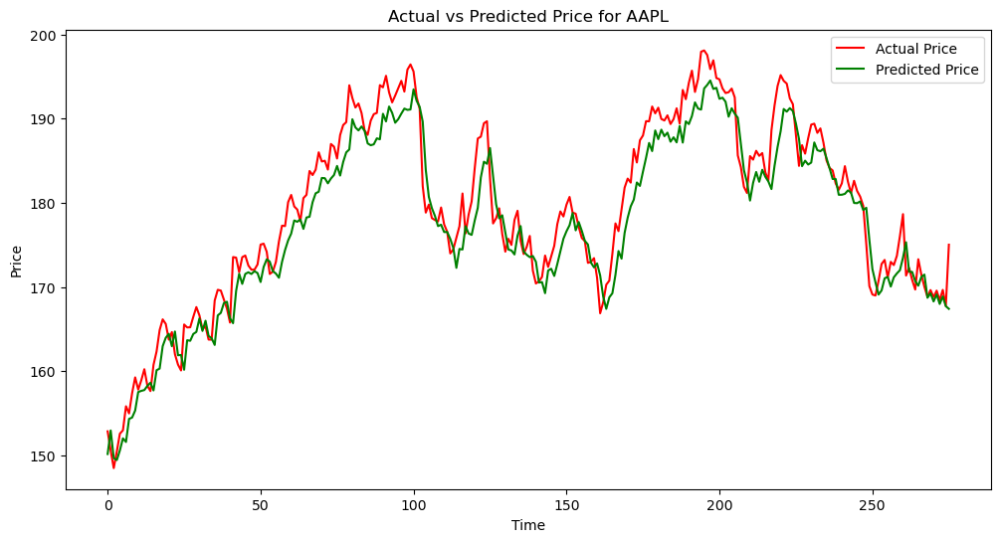

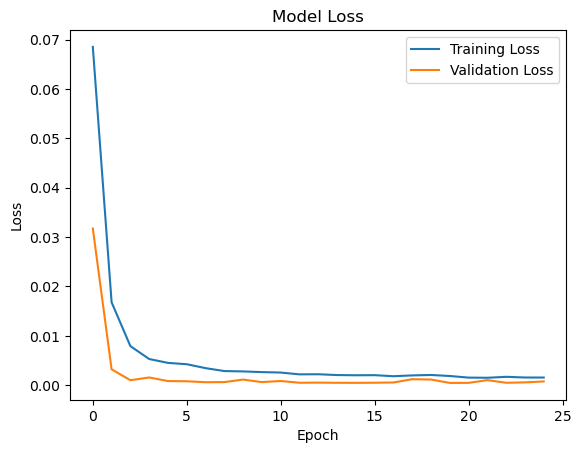

Training on GOOGL
Epoch 1/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0811 - val_loss: 0.0010
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0077 - val_loss: 9.4913e-04
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0042 - val_loss: 8.4507e-04
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0042 - val_loss: 7.8951e-04
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0031 - val_loss: 8.1595e-04
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0031 - val_loss: 8.0505e-04
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0026 - val_loss: 0.0011
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0023 - val_loss: 7.5467e-04
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0024 - val_loss: 7.2916e-04
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0025 - val_loss: 7.3595e-04
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0021 - val_loss: 0.0014
Epoch 12/50
28/28 ━━━━━

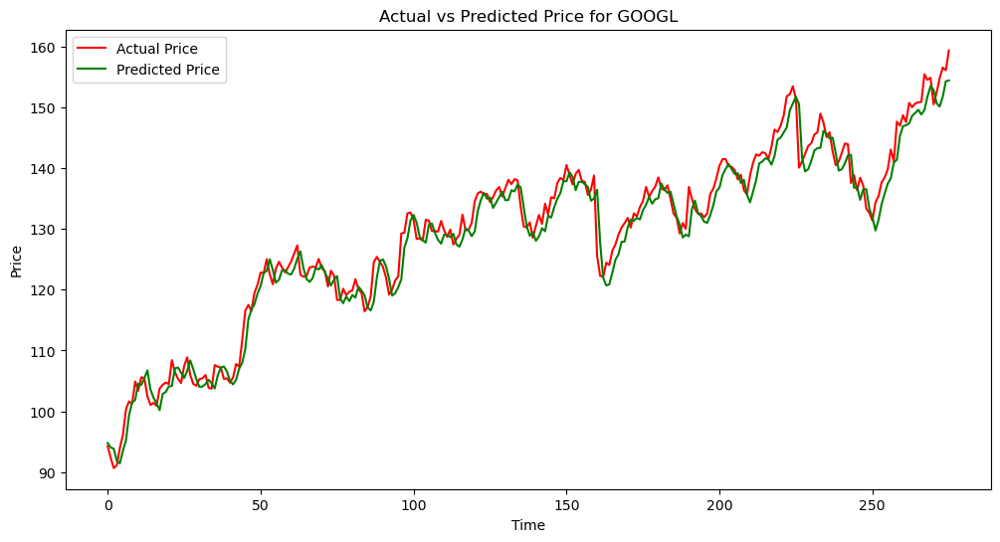

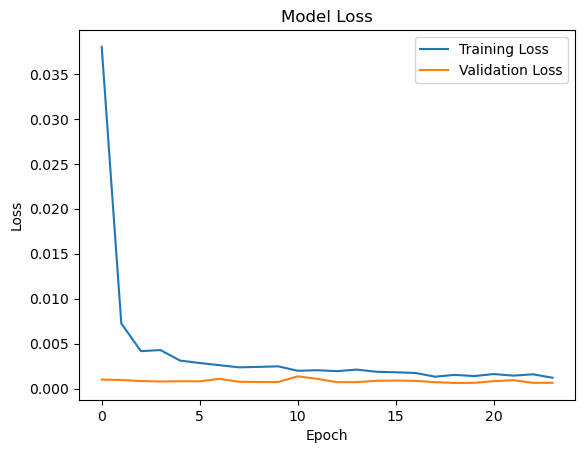

Training on MSFT
Epoch 1/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0783 - val_loss: 5.8317e-04
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0034 - val_loss: 7.5255e-04
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0034 - val_loss: 6.9752e-04
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0024 - val_loss: 5.8943e-04
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0022 - val_loss: 8.5944e-04
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0018 - val_loss: 4.9644e-04
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0020 - val_loss: 8.9708e-04
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0017 - val_loss: 4.6731e-04
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0013 - val_loss: 8.9926e-04
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0016 - val_loss: 0.0013
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0014 - val_loss: 6.2696e-04
Epoch 12/50
28/2

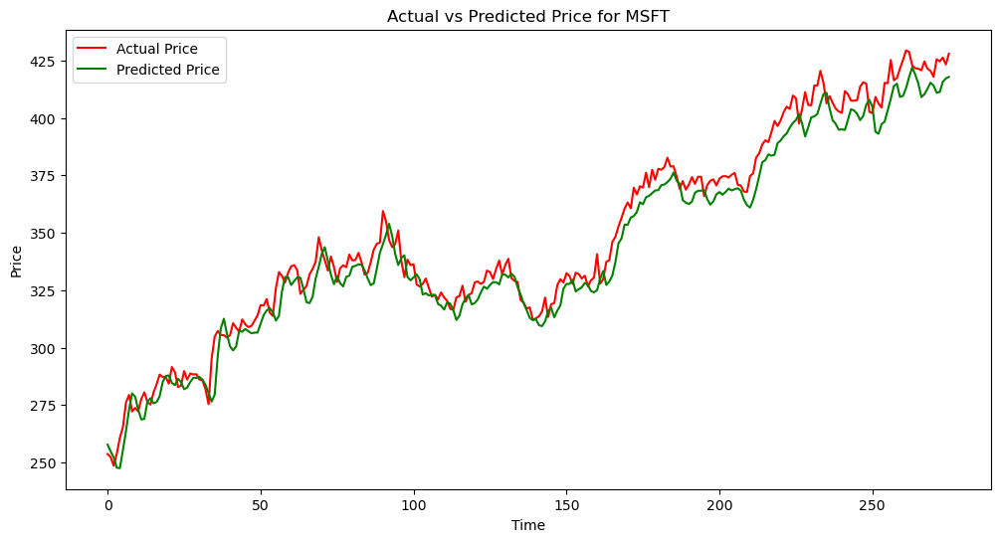

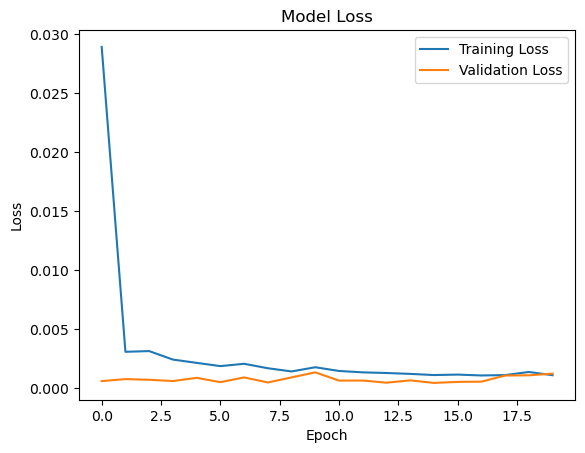

Training on TSLA
Epoch 1/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.1084 - val_loss: 0.0156
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.1312 - val_loss: 0.0149
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0418 - val_loss: 0.0118
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0186 - val_loss: 0.0021
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0121 - val_loss: 0.0070
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0073 - val_loss: 0.0030
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0067 - val_loss: 0.0031
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0059 - val_loss: 0.0027
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0058 - val_loss: 0.0016
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0047 - val_loss: 0.0018
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0043 - val_loss: 0.0020
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - lo

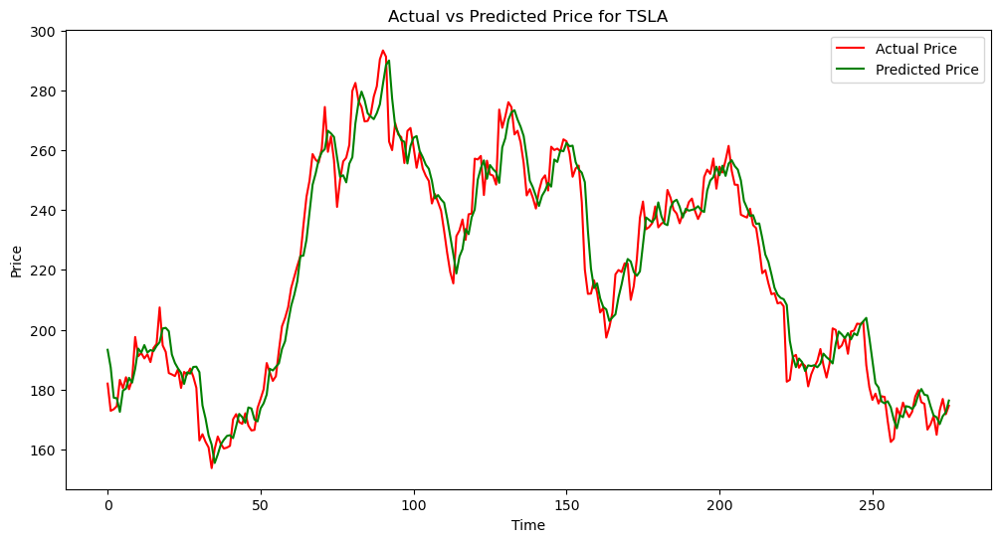

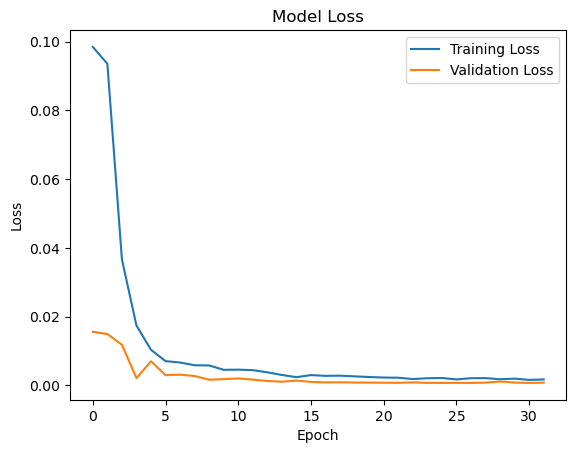

Training on META
Epoch 1/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.1026 - val_loss: 0.0030
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0060 - val_loss: 6.8041e-04
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0037 - val_loss: 7.6018e-04
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0028 - val_loss: 4.8554e-04
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0023 - val_loss: 4.9897e-04
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0020 - val_loss: 7.6732e-04
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0024 - val_loss: 5.6888e-04
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0016 - val_loss: 4.7584e-04
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0015 - val_loss: 4.3920e-04
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0014 - val_loss: 4.5301e-04
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012 - val_loss: 3.9861e-04
Epoch 12/50
28/2

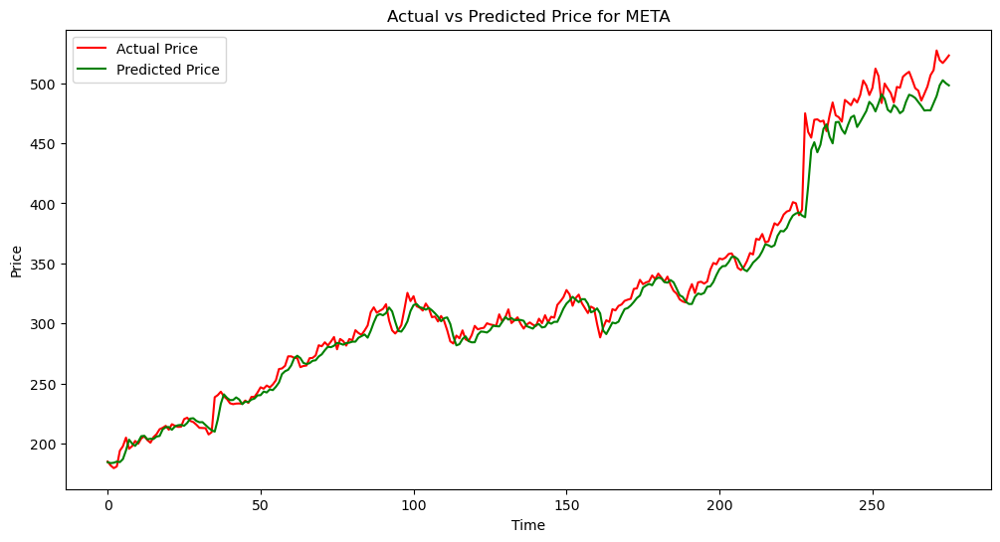

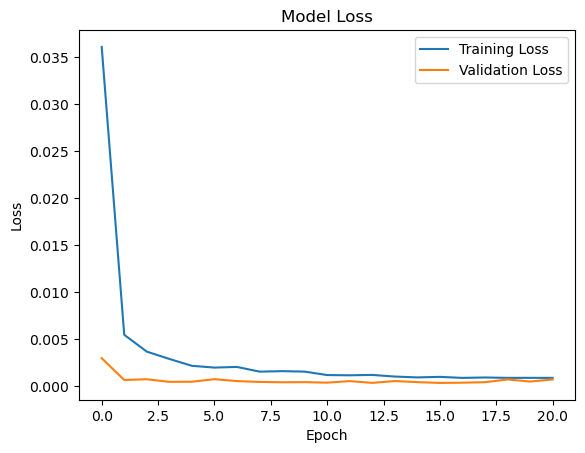

In [78]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense, Dropout
from tensorflow.keras.initializers import Orthogonal
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Input
import matplotlib.pyplot as plt

mse_improved = {}
# Tickers to model
tickers = ['AAPL', 'GOOGL', 'MSFT', 'TSLA', 'META']

# Loop over each ticker
for ticker in tickers:
    print(f"Training on {ticker}")
    # Get the scaled DataFrame for the ticker
    df, scaler = scale__RNN_LSTM(ticker, sp500_data[ticker])
    scaled_df = df['Close'].values.reshape(-1,1)

    # Define sequence length and create sequences
    sequence_length = 200
    X, y = create_sequences(scaled_df, sequence_length)

    # Split data into train and test sets
    split_index = int(len(X) * 0.8)
    X_train, X_test = X[:split_index], X[split_index:]
    y_train, y_test = y[:split_index], y[split_index:]

    if ticker == 'AAPL':
        # Build a more complex RNN model
        model = Sequential([
            Input(shape=(sequence_length, 1)),
            SimpleRNN(units=25, return_sequences=False, kernel_initializer=Orthogonal(gain=1.0, seed=42)),
            Dropout(0.2),
            Dense(units=1)
        ])
        # Compile and fit the model
        model.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error')
        history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1, callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)])
    
    if ticker == 'GOOGL':
        # Build a more complex RNN model
        model = Sequential([
            Input(shape=(sequence_length, 1)),
            SimpleRNN(units=25, return_sequences=False, kernel_initializer=Orthogonal(gain=1.0, seed=42)),
            Dropout(0.2),
            Dense(units=1)
        ])
        # Compile and fit the model
        model.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error')
        history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1, callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)])
        
    if ticker == 'MSFT':
        # Build a more complex RNN model
        model = Sequential([
            Input(shape=(sequence_length, 1)),
            SimpleRNN(units=25, return_sequences=False, kernel_initializer=Orthogonal(gain=1.0, seed=42)),
            Dropout(0.2),
            Dense(units=1)
        ])
        # Compile and fit the model
        model.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error')
        history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1, callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)])
        
    if ticker == 'TSLA':
        # Build a more complex RNN model
        model = Sequential([
            Input(shape=(sequence_length, 1)),
            SimpleRNN(units=25, return_sequences=False, kernel_initializer=Orthogonal(gain=1.0, seed=42)),
            Dropout(0.2),
            Dense(units=1)
        ])
        # Compile and fit the model
        model.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error')
        history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1, callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)])
    
    if ticker == 'META':
        # Build a more complex RNN model
        model = Sequential([
            Input(shape=(sequence_length, 1)),
            SimpleRNN(units=25, return_sequences=False, kernel_initializer=Orthogonal(gain=1.0, seed=42)),
            Dropout(0.2),
            Dense(units=1)
        ])
        # Compile and fit the model
        model.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error')
        history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1, callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)])
        
        
    # Evaluate the model
    loss = model.evaluate(X_test, y_test, verbose=0)
    print(f"Loss for {ticker}: {loss}")
    
    
    mse_improved[ticker] = loss

    # Make predictions
    predictions = model.predict(X_test)

    # Inverse transform to get actual prices
    y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))
    predictions_actual = scaler.inverse_transform(predictions)

    # Plot the actual and predicted prices
    plt.figure(figsize=(12, 6))
    plt.plot(y_test_actual, color='red', label='Actual Price')
    plt.plot(predictions_actual, color='green', label='Predicted Price')
    plt.title(f'Actual vs Predicted Price for {ticker}')
    plt.xlabel('Time')
    plt.ylabel('Price')
    plt.legend()
    plt.show()
    
    # Plot the loss curves
    plot_loss(history)

In [79]:
model.summary()

Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ simple_rnn_36 (SimpleRNN)       │ (None, 25)             │           675 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 25)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 1)              │            26 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,105 (8.23 KB)

 Trainable params: 701 (2.74 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,404 (5.49 KB)

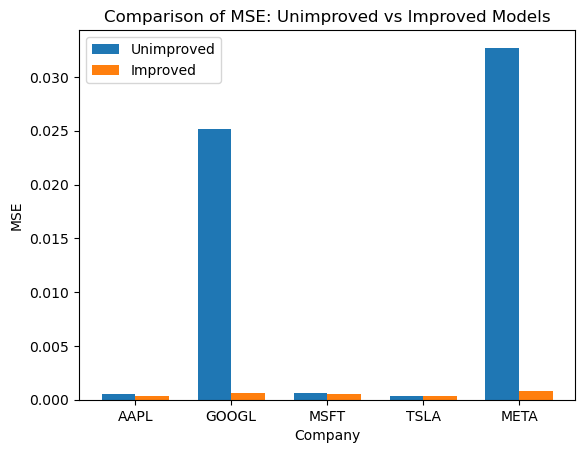

In [80]:
import matplotlib.pyplot as plt
import numpy as np

# Tickers
tickers = ['AAPL', 'GOOGL', 'MSFT', 'TSLA', 'META']

# Gathering data
initial_mse_values = [mse_initial[ticker] for ticker in tickers]
improved_mse_values = [mse_improved[ticker] for ticker in tickers]

# plot
fig, ax = plt.subplots()
bar_width = 0.35
index = np.arange(len(tickers))

# Creating the bars
bars1 = ax.bar(index, initial_mse_values, bar_width, label='Unimproved')
bars2 = ax.bar(index + bar_width, improved_mse_values, bar_width, label='Improved')

# Adding labels, title, and legend
ax.set_xlabel('Company')
ax.set_ylabel('MSE')
ax.set_title('Comparison of RNN MSE: Unimproved vs Improved Models')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(tickers)
ax.legend()

# Showing the plot
plt.show()


## LSTM

Next, we are going to apply LSTM. 

## Baseline LSTM

Training on AAPL
Epoch 1/50


/Users/alexelemele/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1617 - val_loss: 0.0216
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0139 - val_loss: 0.0020
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0015 - val_loss: 0.0028
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 9.5347e-04 - val_loss: 0.0018
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 7.7247e-04 - val_loss: 0.0019
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 7.2535e-04 - val_loss: 0.0017
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 6.6057e-04 - val_loss: 0.0017
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 6.1230e-04 - val_loss: 0.0016
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 5.7156e-04 - val_loss: 0.0015
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 5.3798e-04 - val_loss: 0.0015
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 5.1107e-04 - val_loss: 0.0014
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 

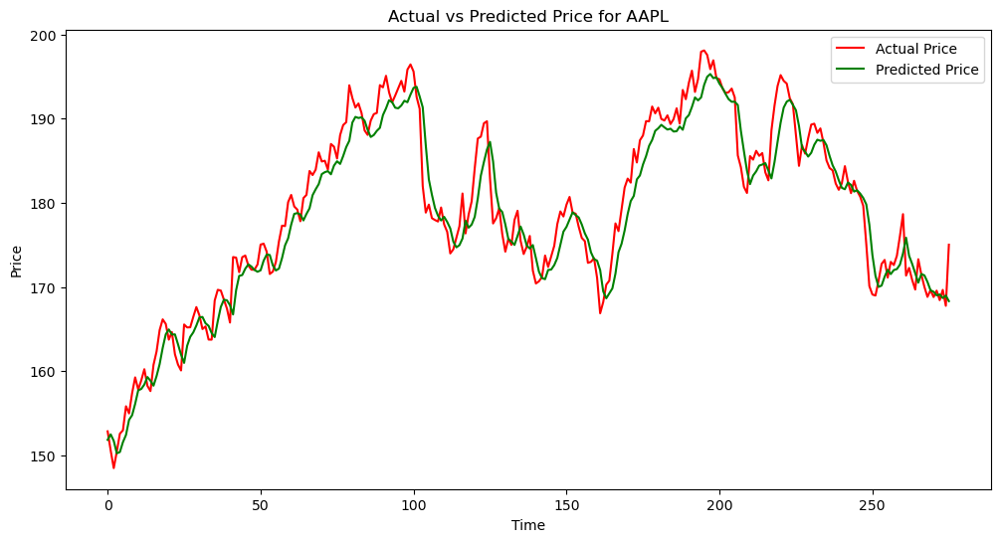

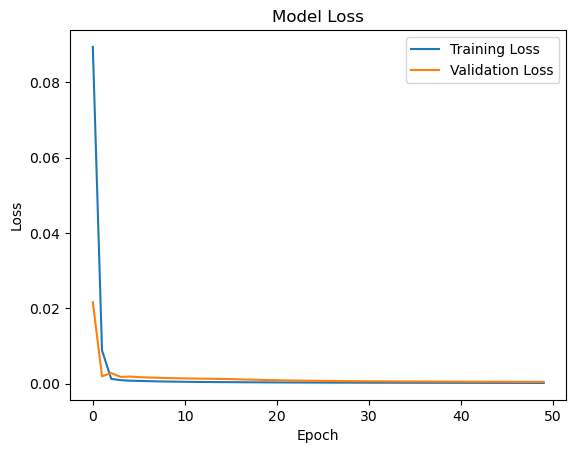

Training on GOOGL
Epoch 1/50


/Users/alexelemele/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.1180 - val_loss: 0.0049
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0023 - val_loss: 0.0020
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0012 - val_loss: 0.0022
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 8.6095e-04 - val_loss: 0.0027
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 8.1975e-04 - val_loss: 0.0032
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 8.1829e-04 - val_loss: 0.0032
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 8.0209e-04 - val_loss: 0.0030
Loss for GOOGL: 0.0013707976322621107
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


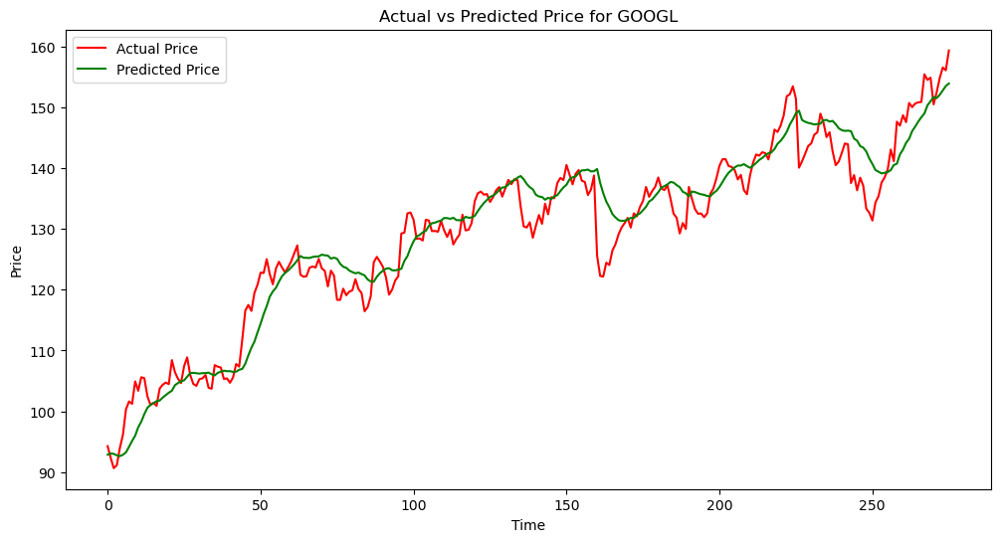

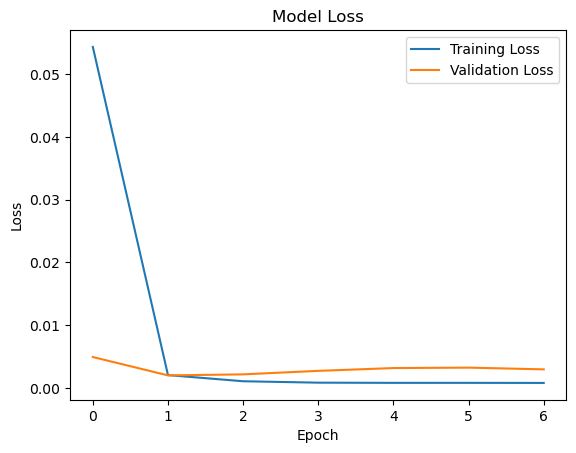

Training on MSFT
Epoch 1/50


/Users/alexelemele/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0866 - val_loss: 0.0060
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0025 - val_loss: 7.4812e-04
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 5.0782e-04 - val_loss: 0.0014
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 4.6494e-04 - val_loss: 0.0014
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 4.3171e-04 - val_loss: 0.0014
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 4.0667e-04 - val_loss: 0.0012
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 3.6886e-04 - val_loss: 9.9039e-04
Loss for MSFT: 0.013307061046361923
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


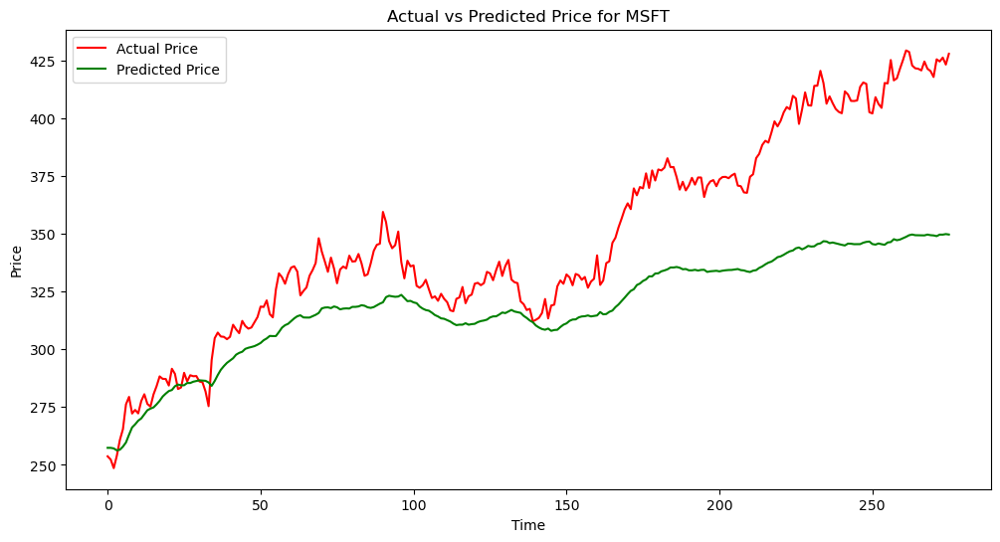

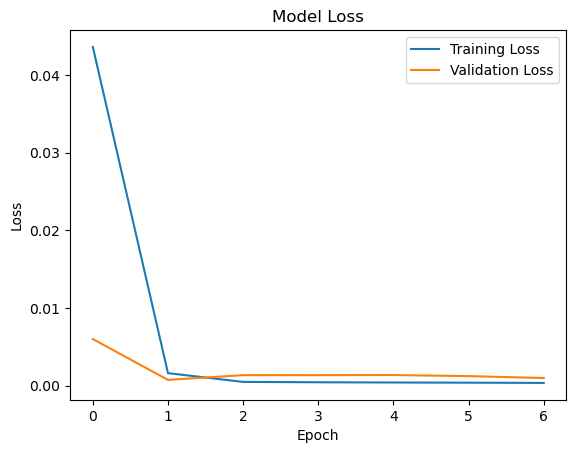

Training on TSLA
Epoch 1/50


/Users/alexelemele/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.2333 - val_loss: 0.0177
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0087 - val_loss: 0.0060
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0034 - val_loss: 0.0030
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0019 - val_loss: 0.0030
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0015 - val_loss: 0.0026
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0013 - val_loss: 0.0023
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0010 - val_loss: 0.0018
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 9.7665e-04 - val_loss: 0.0017
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 9.2835e-04 - val_loss: 0.0016
Epoch 12/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 8.8674

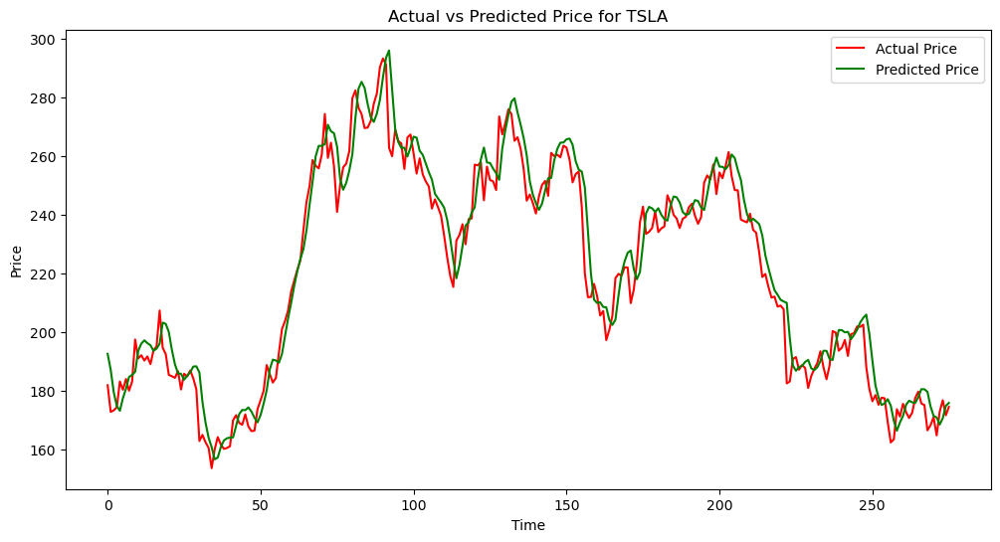

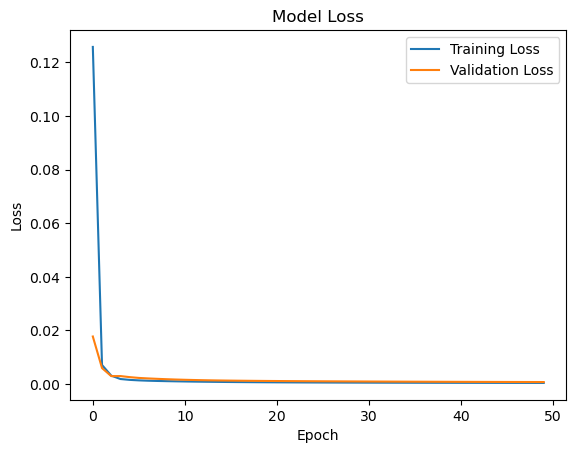

Training on META
Epoch 1/50


/Users/alexelemele/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0756 - val_loss: 0.0075
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0066 - val_loss: 0.0018
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 7.0979e-04 - val_loss: 7.0364e-04
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 4.8477e-04 - val_loss: 7.1697e-04
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 4.7499e-04 - val_loss: 7.9510e-04
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 4.6786e-04 - val_loss: 7.5630e-04
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 4.5009e-04 - val_loss: 7.1520e-04
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 4.2845e-04 - val_loss: 6.8011e-04
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 4.1065e-04 - val_loss: 6.5807e-04
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 3.9790e-04 - val_loss: 6.4213e-04
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 3.8725e-04 - val_loss: 6.2935e-04
Ep

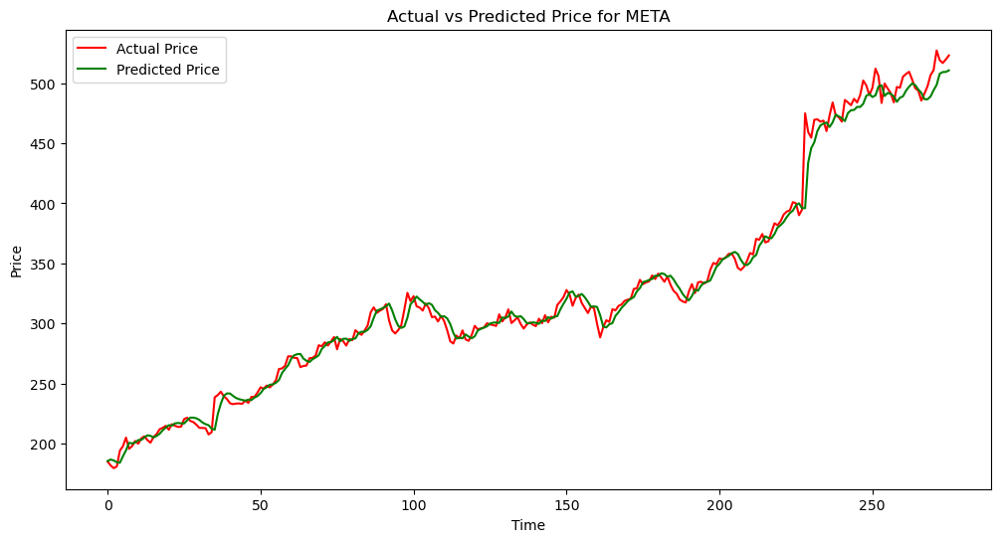

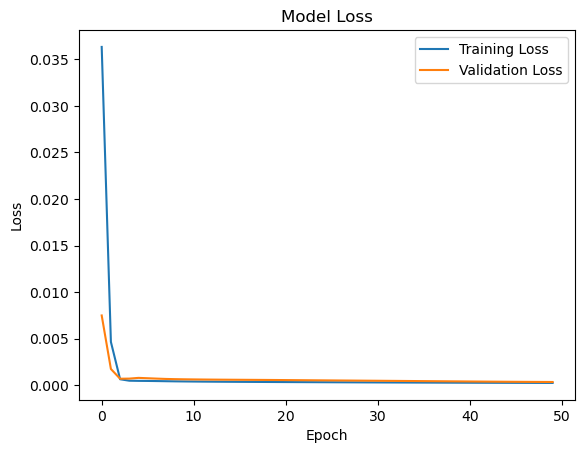

In [87]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import MinMaxScaler


from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense, Dropout
from tensorflow.keras.initializers import Orthogonal
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Input
import matplotlib.pyplot as plt


mse_initial = {}
# Tickers to model
tickers = ['AAPL', 'GOOGL', 'MSFT', 'TSLA', 'META']

# Loop over each ticker
for ticker in tickers:
    print(f"Training on {ticker}")
    # Get the scaled DataFrame for the ticker
    df, scaler = scale__RNN_LSTM(ticker, sp500_data[ticker])
    scaled_df = df['Close'].values.reshape(-1,1)

    # Define sequence length and create sequences
    sequence_length = 200
    X, y = create_sequences(scaled_df, sequence_length)

    # Split data into train and test sets
    split_index = int(len(X) * 0.8)
    X_train, X_test = X[:split_index], X[split_index:]
    y_train, y_test = y[:split_index], y[split_index:]

    if ticker == 'AAPL':
        # Build a more complex RNN model
        # Build Baseline LSTM model
        model = Sequential([
            LSTM(units=5, return_sequences=False, input_shape=(sequence_length, 1)),
            Dense(units=1)
        ])
        # Compile and fit the model
        model.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error')
        history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1, callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)])
    
    if ticker == 'GOOGL':
        # Build a more complex RNN model
        model = Sequential([
            LSTM(units=5, return_sequences=False, input_shape=(sequence_length, 1)),
            Dense(units=1)
        ])
        # Compile and fit the model
        model.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error')
        history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1, callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)])
        
    if ticker == 'MSFT':
        # Build a more complex RNN model
        model = Sequential([
            LSTM(units=5, return_sequences=False, input_shape=(sequence_length, 1)),
            Dense(units=1)
        ])
        # Compile and fit the model
        model.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error')
        history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1, callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)])
        
    if ticker == 'TSLA':
        # Build a more complex RNN model
        model = Sequential([
            LSTM(units=5, return_sequences=False, input_shape=(sequence_length, 1)),
            Dense(units=1)
        ])
        # Compile and fit the model
        model.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error')
        history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1, callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)])
    
    if ticker == 'META':
        # Build a more complex RNN model
        model = Sequential([
            LSTM(units=5, return_sequences=False, input_shape=(sequence_length, 1)),
            Dense(units=1)
        ])
        # Compile and fit the model
        model.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error')
        history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1, callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)])
        
        
    # Evaluate the model
    loss = model.evaluate(X_test, y_test, verbose=0)
    print(f"Loss for {ticker}: {loss}")
    
    mse_initial[ticker] = loss

    # Make predictions
    predictions = model.predict(X_test)

    # Inverse transform to get actual prices
    y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))
    predictions_actual = scaler.inverse_transform(predictions)

    # Plot the actual and predicted prices
    plt.figure(figsize=(12, 6))
    plt.plot(y_test_actual, color='red', label='Actual Price')
    plt.plot(predictions_actual, color='green', label='Predicted Price')
    plt.title(f'Actual vs Predicted Price for {ticker}')
    plt.xlabel('Time')
    plt.ylabel('Price')
    plt.legend()
    plt.show()
    
    # Plot the loss curves
    plot_loss(history)

As seen by the graph, the LSTM model was able to get close to the actual price. What needs to be done now is to look for ways to improve this model. We are going to try to tune the hyperparameters.

In [88]:
model.summary()

Model: "sequential_54"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_17 (LSTM)                  │ (None, 5)              │           140 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_54 (Dense)                │ (None, 1)              │             6 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 440 (1.72 KB)

 Trainable params: 146 (584.00 B)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 294 (1.15 KB)

Judging by the validation curve, there might be a high chance the model is overfitting, meaning that it performs well on the test data but will not achieve the same results to unseen new data. In the following, we are going increase the complexity of the model by adding layers and nodes to the nerual network architecture.

## LSTM improved

Training on AAPL
Epoch 1/50


/Users/alexelemele/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.1796 - val_loss: 0.0011
Epoch 2/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 3/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0016 - val_loss: 0.0032
Epoch 4/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0014 - val_loss: 0.0014
Epoch 5/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0013 - val_loss: 0.0010
Epoch 6/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 9.9318e-04 - val_loss: 0.0014
Epoch 7/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 9.3037e-04 - val_loss: 0.0011
Epoch 8/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 9.4183e-04 - val_loss: 7.9526e-04
Epoch 9/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 6.8374e-04 - val_loss: 7.9327e-04
Epoch 10/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 7.3742e-04 - val_loss: 8.3132e-04
Epoch 11/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 7.5046e-04 - val_loss: 8.8809e-04
Epoch 12/50
56/56 ━━━━━━━━━━━━━━━━

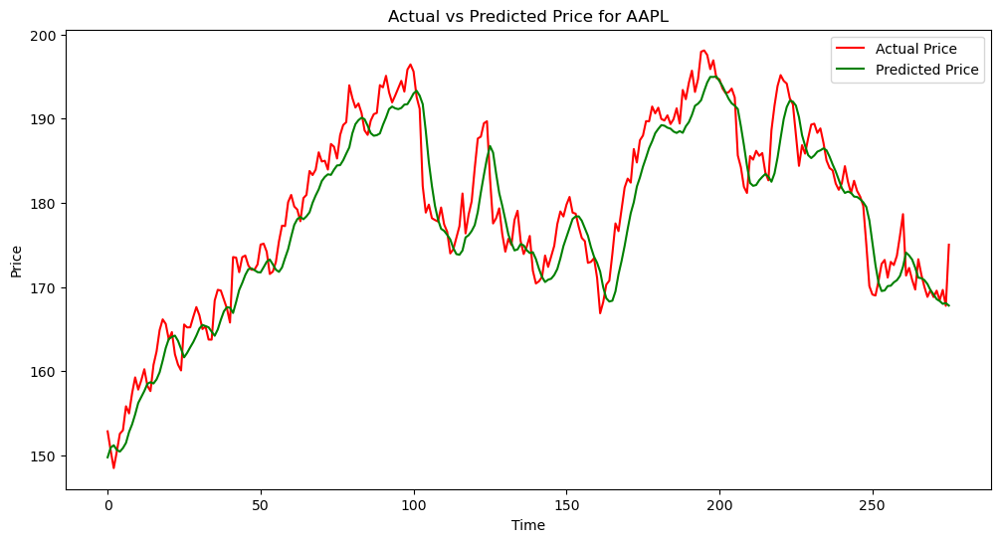

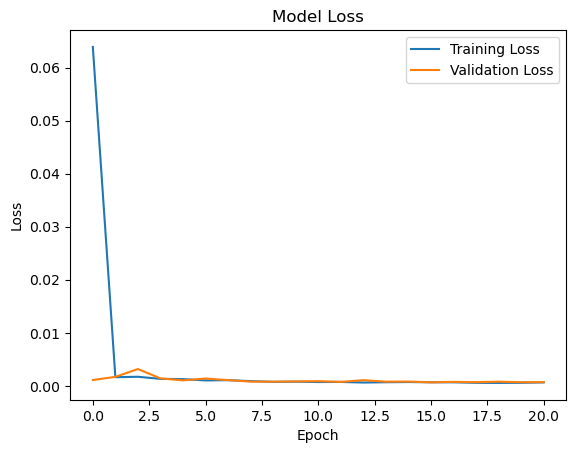

Training on GOOGL
Epoch 1/50


/Users/alexelemele/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.0385 - val_loss: 9.0656e-04
Epoch 2/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0011 - val_loss: 0.0013
Epoch 3/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 9.2729e-04 - val_loss: 9.9648e-04
Epoch 4/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0011 - val_loss: 8.3162e-04
Epoch 5/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 7.0302e-04 - val_loss: 8.1714e-04
Epoch 6/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 8.0354e-04 - val_loss: 8.7766e-04
Epoch 7/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 7.4426e-04 - val_loss: 0.0012
Epoch 8/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 8.1891e-04 - val_loss: 7.8659e-04
Epoch 9/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 7.7739e-04 - val_loss: 7.7015e-04
Epoch 10/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 6.8807e-04 - val_loss: 8.8571e-04
Epoch 11/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 8.1654e-04 - val_loss: 0.0011
Epoch 12/5

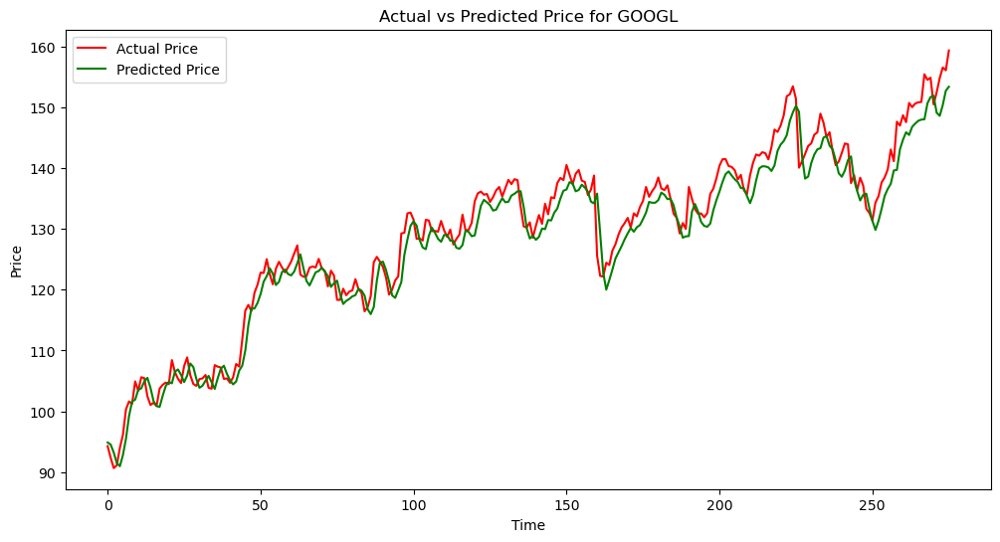

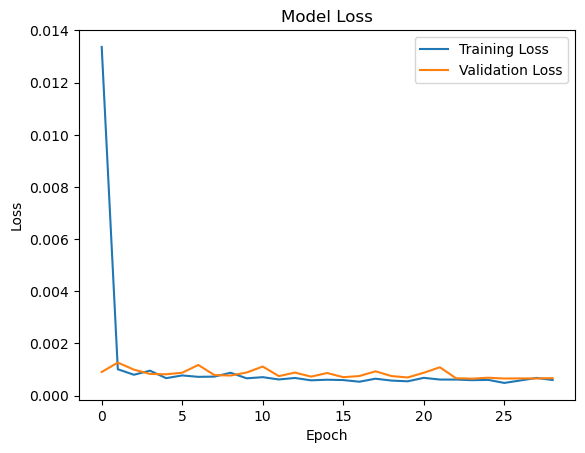

Training on MSFT
Epoch 1/50


/Users/alexelemele/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.0194 - val_loss: 6.4380e-04
Epoch 2/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 6.6150e-04 - val_loss: 5.8639e-04
Epoch 3/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 6.1665e-04 - val_loss: 4.4138e-04
Epoch 4/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 6.1283e-04 - val_loss: 8.3090e-04
Epoch 5/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 6.3929e-04 - val_loss: 7.0641e-04
Epoch 6/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - loss: 4.9734e-04 - val_loss: 4.1473e-04
Epoch 7/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 4.6326e-04 - val_loss: 4.6762e-04
Epoch 8/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 5.7302e-04 - val_loss: 4.4651e-04
Epoch 9/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 4.5642e-04 - val_loss: 4.3023e-04
Epoch 10/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 4.4570e-04 - val_loss: 4.8277e-04
Epoch 11/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 3.8920e-04 - val_loss: 4

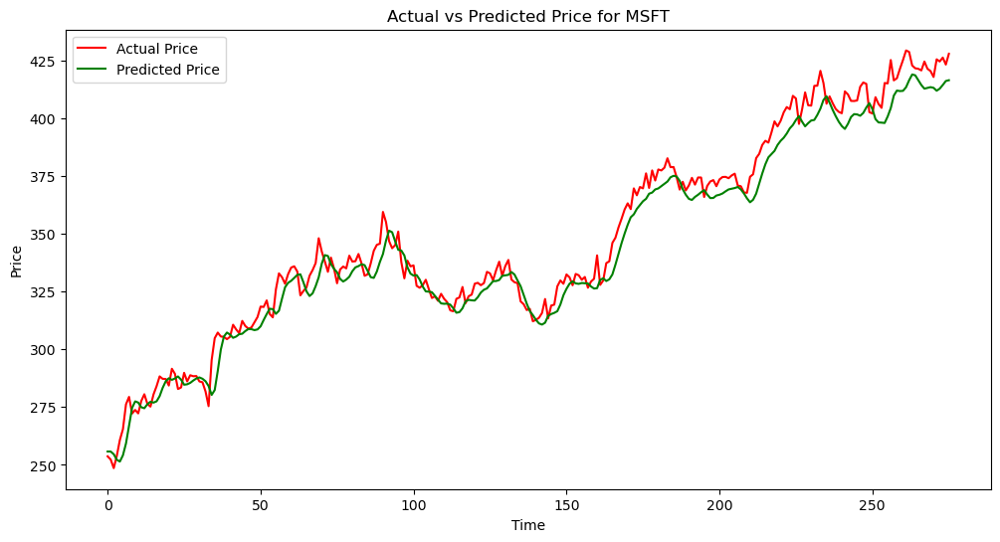

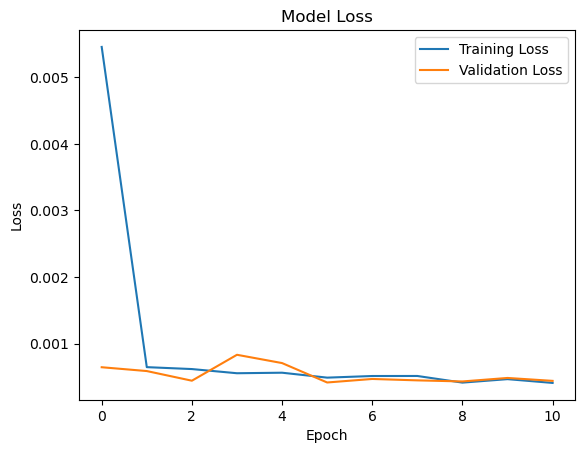

Training on TSLA
Epoch 1/50


/Users/alexelemele/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.0217 - val_loss: 9.7003e-04
Epoch 2/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0018 - val_loss: 0.0010
Epoch 3/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0013 - val_loss: 9.4945e-04
Epoch 4/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 9.7157e-04 - val_loss: 8.3644e-04
Epoch 5/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0012 - val_loss: 0.0011
Epoch 6/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 8.7530e-04 - val_loss: 7.7661e-04
Epoch 7/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0015 - val_loss: 8.8678e-04
Epoch 8/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 9.3122e-04 - val_loss: 7.0341e-04
Epoch 9/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0011 - val_loss: 8.1695e-04
Epoch 10/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 8.0635e-04 - val_loss: 6.7355e-04
Epoch 11/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 7.0562e-04 - val_loss: 6.5037e-04
Epoch 12/50
56/56 

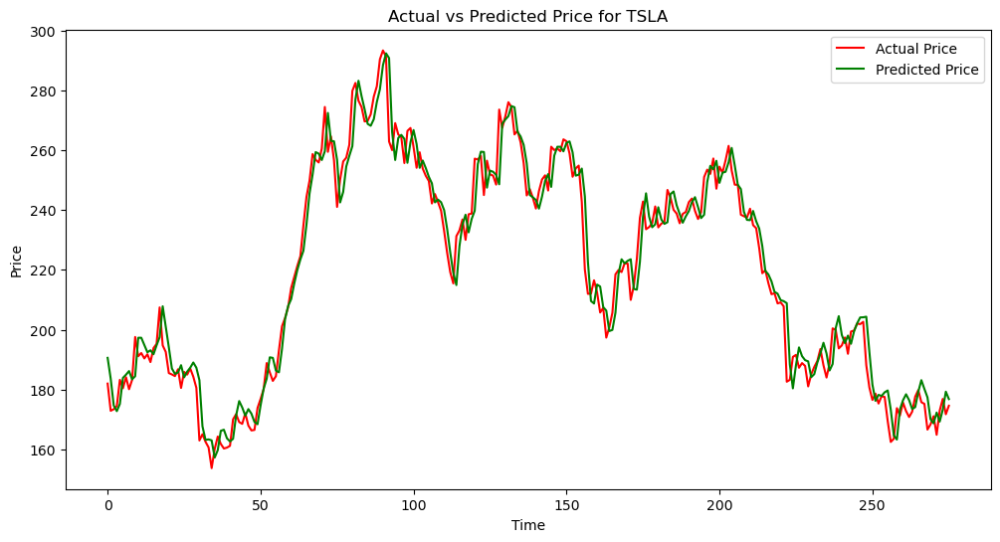

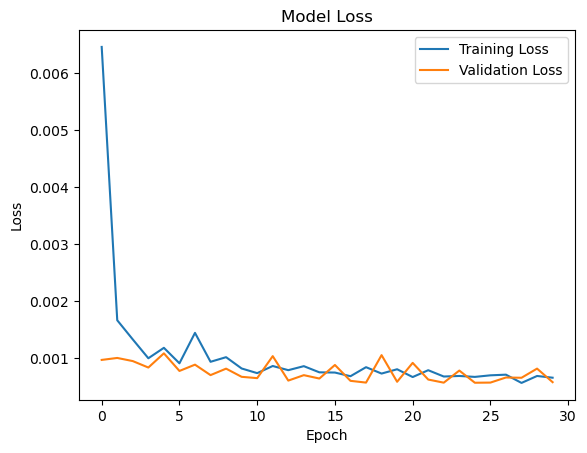

Training on META
Epoch 1/50


/Users/alexelemele/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:205: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


56/56 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.0171 - val_loss: 4.1454e-04
Epoch 2/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 6.8395e-04 - val_loss: 4.9734e-04
Epoch 3/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 5.8915e-04 - val_loss: 5.0745e-04
Epoch 4/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 7.4113e-04 - val_loss: 4.0644e-04
Epoch 5/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 5.8907e-04 - val_loss: 4.1556e-04
Epoch 6/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 6.1362e-04 - val_loss: 3.3982e-04
Epoch 7/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 6.1801e-04 - val_loss: 3.1449e-04
Epoch 8/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 4.8737e-04 - val_loss: 4.5751e-04
Epoch 9/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 4.7641e-04 - val_loss: 6.7479e-04
Epoch 10/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 5.6146e-04 - val_loss: 4.5405e-04
Epoch 11/50
56/56 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 5.6950e-04 - val_loss: 3

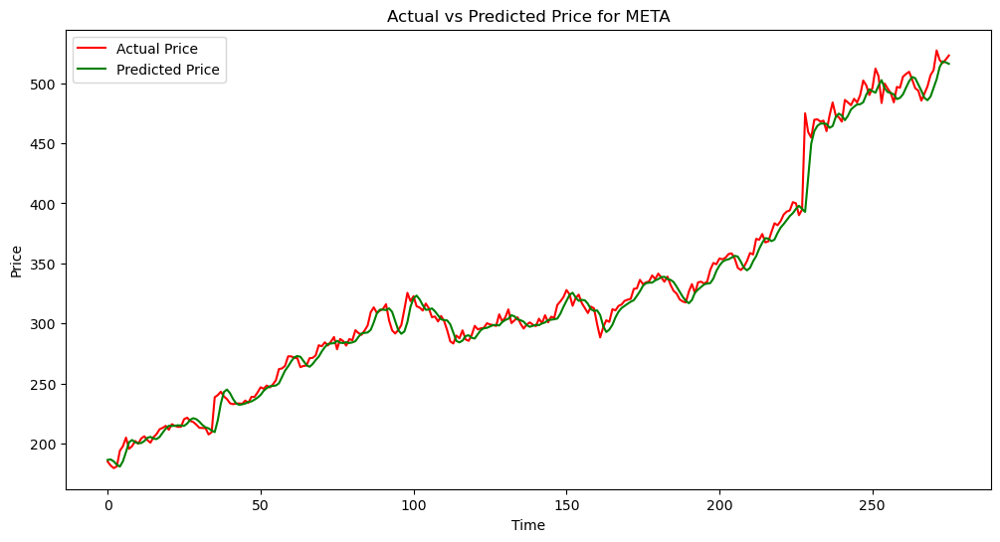

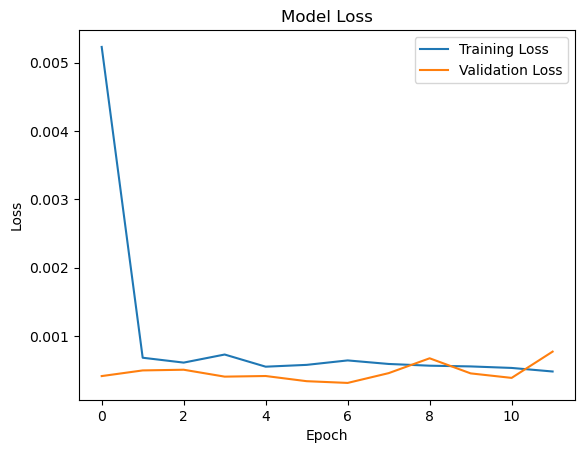

In [89]:
from keras.layers import Activation
from tensorflow.keras.optimizers import Adam



import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import MinMaxScaler


from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense, Dropout
from tensorflow.keras.initializers import Orthogonal
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Input
import matplotlib.pyplot as plt


mse_improved = {}
# Tickers to model
tickers = ['AAPL', 'GOOGL', 'MSFT', 'TSLA', 'META']

# Loop over each ticker
for ticker in tickers:
    print(f"Training on {ticker}")
    # Get the scaled DataFrame for the ticker
    df, scaler = scale__RNN_LSTM(ticker, sp500_data[ticker])
    scaled_df = df['Close'].values.reshape(-1,1)

    # Define sequence length and create sequences
    sequence_length = 200
    X, y = create_sequences(scaled_df, sequence_length)

    # Split data into train and test sets
    split_index = int(len(X) * 0.8)
    X_train, X_test = X[:split_index], X[split_index:]
    y_train, y_test = y[:split_index], y[split_index:]

    if ticker == 'AAPL':
        # Build improved LSTM model
        # Build more complex LSTM model with ReLU activation
        model = Sequential([
            LSTM(units=90, return_sequences=False, input_shape=(sequence_length, 1)),
            Dropout(0.1),
            Dense(units=1)
        ])
        # Compile and fit the model
        model.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error')
        history = model.fit(X_train, y_train, epochs=50, batch_size=16, validation_split=0.2, verbose=1, callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)])
    
    if ticker == 'GOOGL':
        # Build a more complex RNN model
        model = Sequential([
            LSTM(units=90, return_sequences=False, input_shape=(sequence_length, 1)),
            Dropout(0.1),
            Dense(units=1)
        ])
        # Compile and fit the model
        model.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error')
        history = model.fit(X_train, y_train, epochs=50, batch_size=16, validation_split=0.2, verbose=1, callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)])
        
    if ticker == 'MSFT':
        # Build a more complex RNN model
        model = Sequential([
            LSTM(units=90, return_sequences=False, input_shape=(sequence_length, 1)),
            Dropout(0.1),
            Dense(units=1)
        ])
        # Compile and fit the model
        model.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error')
        history = model.fit(X_train, y_train, epochs=50, batch_size=16, validation_split=0.2, verbose=1, callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)])
        
    if ticker == 'TSLA':
        # Build a more complex RNN model
        model = Sequential([
            LSTM(units=90, return_sequences=False, input_shape=(sequence_length, 1)),
            Dropout(0.1),
            Dense(units=1)
        ])
        # Compile and fit the model
        model.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error')
        history = model.fit(X_train, y_train, epochs=50, batch_size=16, validation_split=0.2, verbose=1, callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)])
    
    if ticker == 'META':
        # Build a more complex RNN model
        model = Sequential([
            LSTM(units=90, return_sequences=False, input_shape=(sequence_length, 1)),
            Dropout(0.1),
            Dense(units=1)
        ])
        # Compile and fit the model
        model.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error')
        history = model.fit(X_train, y_train, epochs=50, batch_size=16, validation_split=0.2, verbose=1, callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)])
        
        
    # Evaluate the model
    loss = model.evaluate(X_test, y_test, verbose=0)
    print(f"Loss for {ticker}: {loss}")
    
    mse_improved[ticker] = loss

    # Make predictions
    predictions = model.predict(X_test)

    # Inverse transform to get actual prices
    y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))
    predictions_actual = scaler.inverse_transform(predictions)

    # Plot the actual and predicted prices
    plt.figure(figsize=(12, 6))
    plt.plot(y_test_actual, color='red', label='Actual Price')
    plt.plot(predictions_actual, color='green', label='Predicted Price')
    plt.title(f'Actual vs Predicted Price for {ticker}')
    plt.xlabel('Time')
    plt.ylabel('Price')
    plt.legend()
    plt.show()
    
    # Plot the loss curves
    plot_loss(history)

In [90]:
model.summary()

Model: "sequential_59"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_22 (LSTM)                  │ (None, 90)             │        33,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_25 (Dropout)            │ (None, 90)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 1)              │            91 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 99,635 (389.20 KB)

 Trainable params: 33,211 (129.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 66,424 (259.47 KB)

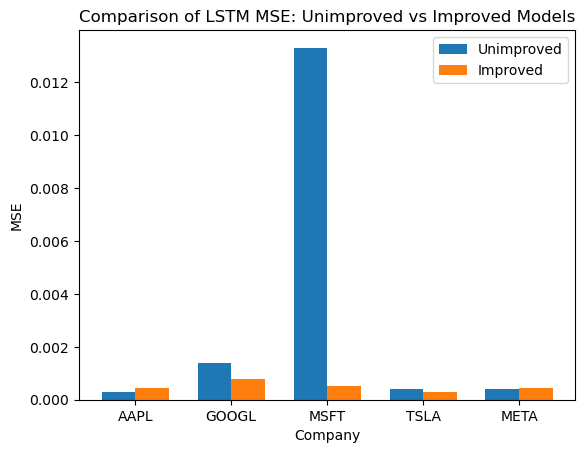

In [91]:
import matplotlib.pyplot as plt
import numpy as np

# Tickers
tickers = ['AAPL', 'GOOGL', 'MSFT', 'TSLA', 'META']

# Gathering data
initial_mse_values = [mse_initial[ticker] for ticker in tickers]
improved_mse_values = [mse_improved[ticker] for ticker in tickers]

# plot
fig, ax = plt.subplots()
bar_width = 0.35
index = np.arange(len(tickers))

# Creating the bars
bars1 = ax.bar(index, initial_mse_values, bar_width, label='Unimproved')
bars2 = ax.bar(index + bar_width, improved_mse_values, bar_width, label='Improved')

# Adding labels, title, and legend
ax.set_xlabel('Company')
ax.set_ylabel('MSE')
ax.set_title('Comparison of LSTM MSE: Unimproved vs Improved Models')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(tickers)
ax.legend()

# Showing the plot
plt.show()

In [92]:
model.save('my_lstm_model.keras')  # Saves the model to a keras file

*********************

## ARIMA

**NOTE: Since ARIMA is a statistical model

In [93]:
apple_close = sp500_data['AAPL']['Close'].copy()

In [94]:
print(apple_close.head())

Date
2018-01-02    43.064999
2018-01-03    43.057499
2018-01-04    43.257500
2018-01-05    43.750000
2018-01-08    43.587502
Name: Close, dtype: float64


In [95]:
apple_close.describe()

count    1579.000000
mean      113.524837
std        51.957246
min        35.547501
25%        54.696251
50%       126.522499
75%       157.960007
max       198.110001
Name: Close, dtype: float64

In [96]:
apple_close.asfreq('B')

Date
2018-01-02     43.064999
2018-01-03     43.057499
2018-01-04     43.257500
2018-01-05     43.750000
2018-01-08     43.587502
                 ...    
2024-04-05    169.580002
2024-04-08    168.449997
2024-04-09    169.669998
2024-04-10    167.779999
2024-04-11    175.039993
Freq: B, Name: Close, Length: 1638, dtype: float64

## ADF test

The Augmented Dickey-Fuller (ADF) test is a statistical test to determine whether a unit root is present in a time series dataset. In the context of ARIMA modeling, the ADF test is used to check the stationarity of a time series, which is important when building an ARIMA model.

Stationarity implies that the statistical properties of a time series, such as mean, variance, and autocorrelation, do not change over time. ARIMA models require the underlying time series to be stationary or made stationary through differencing.

The ADF test helps determine whether differencing is necessary to achieve stationarity. If the p-value from the ADF test is less than a significance level (e.g., 0.05), then the null hypothesis (non-stationarity) is rejected, indicating that the time series is stationary. On the other hand, if the p-value is greater than the significance level, the null hypothesis cannot be rejected, suggesting that the time series is non-stationary.

The ADF test is used in ARIMA modeling to assess the stationarity of a time series, which is non-negotiable for determining the appropriate parameters (d, p, and q) of the ARIMA model.

In [97]:
import pandas as pd
from statsmodels.tsa.stattools import adfuller

# Perform ADF test
result = adfuller(apple_close)

# Extract and print results
print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))


ADF Statistic: -0.9788097377317773
p-value: 0.7609142959427927
Critical Values:
	1%: -3.435
	5%: -2.863
	10%: -2.568


The p value (0.9764553250780864) of after application of the ADF test is very high. It is clear that the price is non-stationary.

It is usual for prices of a stock to be non-stationary, because if they were, a trading strategy such as buying low and selling high would work.

To address the issue of non-stationarity, I will compute the returns from the price series. Returns are used in financial analysis because they tend to exhibit stationarity properties. By taking the difference between consecutive prices and normalizing them, I will obtain a series of returns that may be more suitable for analysis.

## Autocorrelation Function

The autocorrelation function (ACF) is a statistical tool used to measure the correlation between a time series and its lagged values. In the context of analyzing stock price data, the ACF can provide insights into the presence of serial correlation, which refers to the degree of correlation between consecutive observations in a time series.

The ACF is particularly relevant when assessing the stationarity of a time series. In the context of the Augmented Dickey-Fuller (ADF) test, the ACF can help determine the presence of serial correlation in the residuals of the model. If the residuals show significant autocorrelation at certain lags, it may indicate that the model fails to capture some underlying patterns in the data.

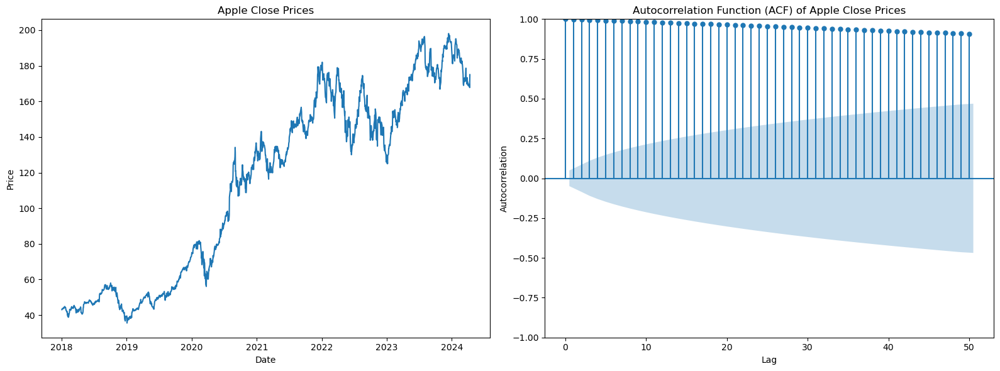

In [98]:
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(16, 6))

# Plot Apple Close Prices
axs[0].plot(apple_close)
axs[0].set_title('Apple Close Prices')
axs[0].set_xlabel('Date')
axs[0].set_ylabel('Price')

# Plot ACF
plot_acf(apple_close, lags=50, ax=axs[1])
axs[1].set_title('Autocorrelation Function (ACF) of Apple Close Prices')
axs[1].set_xlabel('Lag')
axs[1].set_ylabel('Autocorrelation')

plt.tight_layout()
plt.show()

In [99]:
# Take the first difference of the series
diff = apple_close.diff().dropna()

# Perform ADF test on the differenced series
result_diff = adfuller(diff)

# Extract and print results
print('ADF Statistic (After differencing):', result_diff[0])
print('p-value (After differencing):', result_diff[1])
print('Critical Values:')
for key, value in result_diff[4].items():
    print('\t%s: %.3f' % (key, value))


ADF Statistic (After differencing): -40.86038401635267
p-value (After differencing): 0.0
Critical Values:
	1%: -3.435
	5%: -2.863
	10%: -2.568


The ADF test statistic after differencing is significantly negative (-22.576), and the p-value is very close to zero (0.0). This indicates strong evidence against the null hypothesis of non-stationarity, suggesting that the differenced series is stationary.

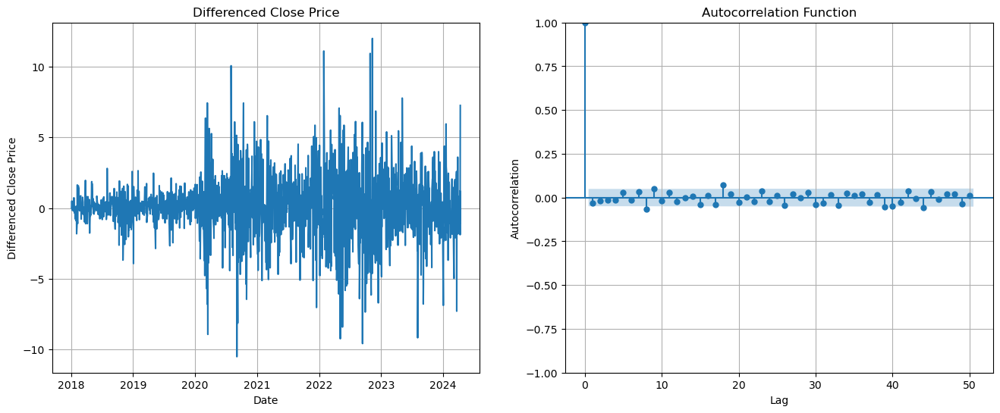

In [100]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf

# Create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot differenced close price
ax1.plot(diff)
ax1.set_title('Differenced Close Price')
ax1.set_xlabel('Date')
ax1.set_ylabel('Differenced Close Price')
ax1.grid(True)

# Plot autocorrelation function
plot_acf(diff, lags=50, ax=ax2)
ax2.set_title('Autocorrelation Function')
ax2.set_xlabel('Lag')
ax2.set_ylabel('Autocorrelation')
ax2.grid(True)

plt.show()

2 as q

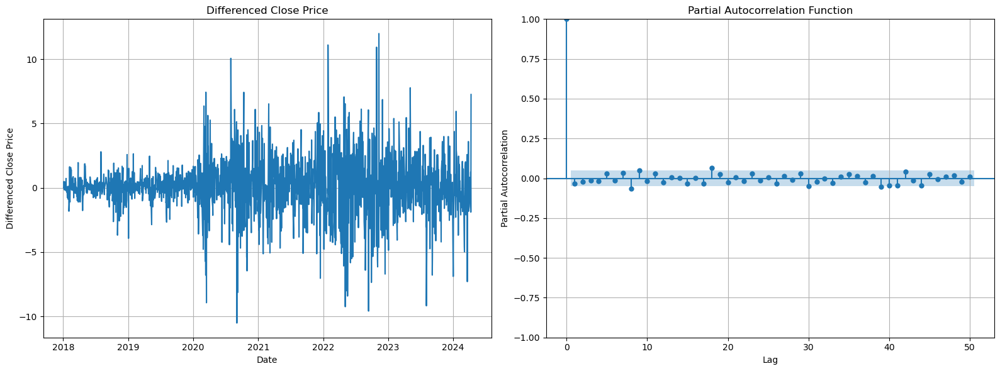

In [101]:
from statsmodels.graphics.tsaplots import plot_pacf
import matplotlib.pyplot as plt

# Correct the subplot setup to create two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot differenced close price on the first subplot
ax1.plot(diff)
ax1.set_title('Differenced Close Price')
ax1.set_xlabel('Date')
ax1.set_ylabel('Differenced Close Price')
ax1.grid(True)

# Plot Partial Autocorrelation Function (PACF) on the second subplot
plot_pacf(diff, lags=50, ax=ax2) 
ax2.set_title('Partial Autocorrelation Function')
ax2.set_xlabel('Lag')
ax2.set_ylabel('Partial Autocorrelation')
ax2.grid(True)

plt.tight_layout()
plt.show()



2 as p

## Arima model

In [102]:
print(apple_close.index.freq)

None


In [103]:
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt

# Define the model
model = ARIMA(apple_close, order=(2, 1, 2)) 

# Fit the model
model_fit = model.fit()

# Summary of the model
print(model_fit.summary())

                               SARIMAX Results                                
Dep. Variable:                  Close   No. Observations:                 1579
Model:                 ARIMA(2, 1, 2)   Log Likelihood               -3500.045
Date:                Wed, 17 Apr 2024   AIC                           7010.089
Time:                        01:10:36   BIC                           7036.909
Sample:                             0   HQIC                          7020.055
                               - 1579                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0369      3.466      0.011      0.991      -6.757       6.831
ar.L2          0.1648      1.866      0.088      0.930      -3.492       3.822
ma.L1         -0.0687      3.465     -0.020      0.9

/Users/alexelemele/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/alexelemele/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/alexelemele/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/alexelemele/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting p

* AR Terms: The model includes two autoregressive terms (ar.L1 and ar.L2) with coefficients -0.5165 and -0.9824, respectively, both  significant (p < 0.0001), indicating a impact on the model.
* MA Terms: Two moving average terms (ma.L1 and ma.L2) are present with coefficients 0.5322 and 0.9985, respectively, also showing significance. This highlights the influence of past error terms on the current value.

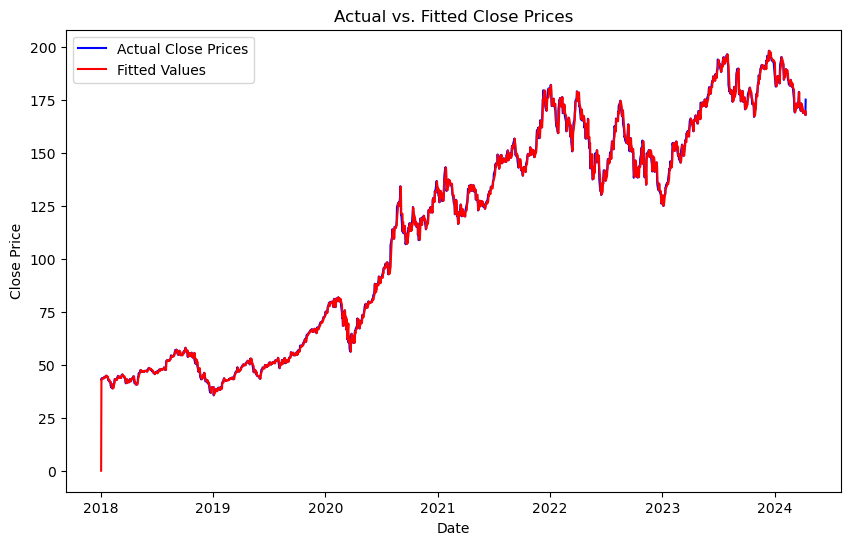

In [104]:
# Plot the actual close prices
plt.figure(figsize=(10, 6))
plt.plot(apple_close, label='Actual Close Prices', color='blue')

# Plot the fitted values
plt.plot(model_fit.fittedvalues, label='Fitted Values', color='red')

plt.title('Actual vs. Fitted Close Prices')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()


Overall, the ARIMA(2, 1, 2) model provides a meaningful fit to the stock closing prices, capturing key autoregressive and moving average effects.

/var/folders/7s/cm399mc55pd8q0tgj3ppcj2h0000gn/T/ipykernel_85577/2835069385.py:9: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(residuals, color="blue", kde=True, hist=True)


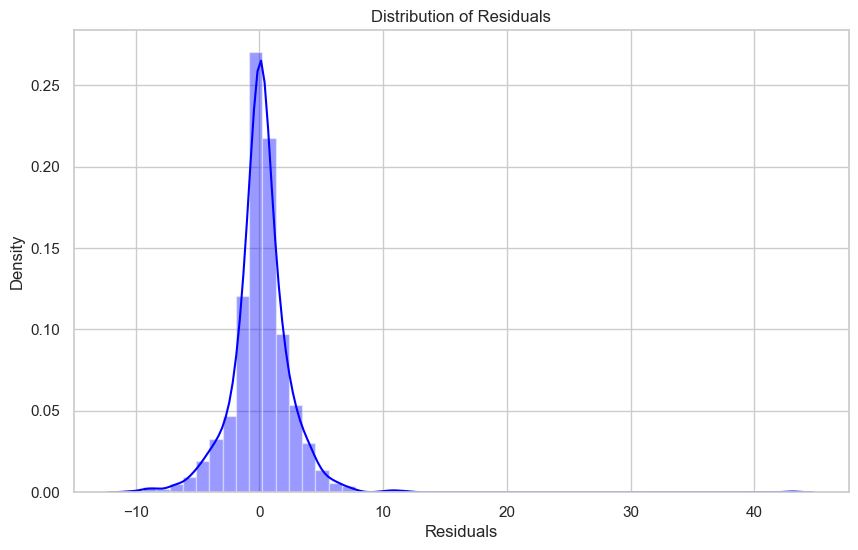

In [105]:
import seaborn as sns

# Get the residuals from the model
residuals = model_fit.resid

# Plotting the distribution of residuals
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
sns.distplot(residuals, color="blue", kde=True, hist=True)
plt.title('Distribution of Residuals')
plt.xlabel('Residuals')
plt.ylabel('Density')
plt.show()

The distribution of the residuals around the 0-mean indicates that patterns were captured well and without any bias.

In [106]:
import pmdarima as pm
from pmdarima import auto_arima


# Use auto_arima to find the best ARIMA model
model = auto_arima(apple_close, start_p=1, start_q=1,
                   max_p=8, max_q=8, max_d=2,
                   seasonal=False,  # Set to True if the series is seasonal
                   trace=True, error_action='ignore',  
                   suppress_warnings=True, stepwise=True)

print(model.summary())


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=7005.589, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=7004.120, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=7004.469, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=7004.401, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=7004.351, Time=0.01 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0] intercept
Total fit time: 0.274 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1579
Model:               SARIMAX(0, 1, 0)   Log Likelihood               -3500.060
Date:                Wed, 17 Apr 2024   AIC                           7004.120
Time:                        01:10:41   BIC                           7014.848
Sample:                             0   HQIC                          7008.107
                               - 1579                                       

The Parameter-tuning process indicates that ARIMA(1,1,1) yields the best fit for this specific dataset. Lets fit the aforementioned model.

In [107]:
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt

# Define the model
model = ARIMA(apple_close, order=(1, 1, 1)) 

# Fit the model
model_fit = model.fit()

# Summary of the model
print(model_fit.summary())

                               SARIMAX Results                                
Dep. Variable:                  Close   No. Observations:                 1579
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -3500.065
Date:                Wed, 17 Apr 2024   AIC                           7006.130
Time:                        01:10:42   BIC                           7022.222
Sample:                             0   HQIC                          7012.109
                               - 1579                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4620      0.394      1.173      0.241      -0.310       1.234
ma.L1         -0.4954      0.388     -1.276      0.202      -1.256       0.265
sigma2         4.9441      0.111     44.624      0.0

/Users/alexelemele/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/alexelemele/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/alexelemele/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


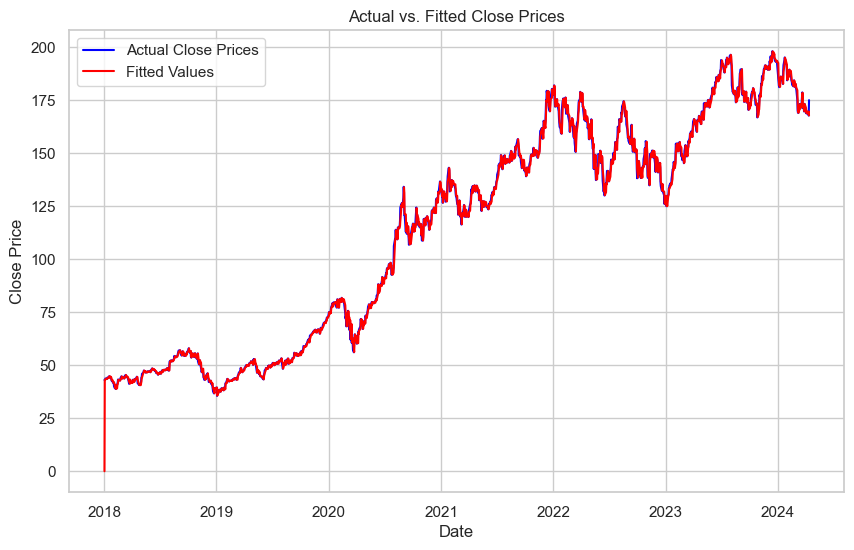

In [109]:
# Plot the actual close prices
plt.figure(figsize=(10, 6))
plt.plot(apple_close, label='Actual Close Prices', color='blue')

# Plot the fitted values
plt.plot(model_fit.fittedvalues, label='Fitted Values', color='red')

plt.title('Actual vs. Fitted Close Prices')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()


The results show that the difference between both ARIMA models is not significant. However, we are still going to choose ARIMA(1,1,1)

*****************